### Housing Price Prediction (Advanced Regression Assignment)

#### Problem Statement

A US-based housing company named Surprise Housing has decided to enter the Australian market. The company uses data analytics to purchase houses at a price below their actual values and flip them on at a higher price. For the same purpose, the company has collected a data set from the sale of houses in Australia. The data is provided in the CSV file below.

The company is looking at prospective properties to buy to enter the market. You are required to build a regression model using regularisation in order to predict the actual value of the prospective properties and decide whether to invest in them or not.

The company wants to know:

Which variables are significant in predicting the price of a house, and

How well those variables describe the price of a house.


Also, determine the optimal value of lambda for ridge and lasso regression.

 
#### Business Goal 

You are required to model the price of houses with the available independent variables. This model will then be used by the management to understand how exactly the prices vary with the variables. They can accordingly manipulate the strategy of the firm and concentrate on areas that will yield high returns. Further, the model will be a good way for management to understand the pricing dynamics of a new market.

In [124]:
# Required liberaries import
import numpy as np
import pandas as pd

from sklearn.preprocessing import LabelEncoder
from sklearn import metrics
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
import statsmodels.api as sm
from sklearn.linear_model import LinearRegression, Ridge, Lasso

from sklearn.model_selection import train_test_split

from sklearn.feature_selection import RFE
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.model_selection import GridSearchCV

from sklearn.metrics import r2_score,mean_squared_error

import warnings
warnings.filterwarnings("ignore")


In [2]:
#setting maximum display rows and columns to see all data in dataframe
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)

##### Data Overview

In [3]:
# Data load from CSV file
housing_data = pd.read_csv("train.csv")
#print shape and column names
print(housing_data.shape)
print(housing_data.columns)

(1460, 81)
Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 

In [4]:
housing_data.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


##### Data Understanding

In [5]:
# initial information about dataframe
housing_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [6]:
#data description 
housing_data.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [7]:
housing_data_desc = housing_data.describe()

In [8]:
housing_data_desc[['MSSubClass']]

,MSSubClass
count,1460.000000
mean,56.897260
std,42.300571
min,20.000000
25%,20.000000
50%,50.000000
75%,70.000000
max,190.000000


#### Handle missing values

In [9]:
#Drop columns with too many null/missing values
housing_data.drop(columns=['Alley','PoolQC','Fence', 'MiscFeature'], inplace=True)

In [10]:
#print Null/Missing values
housing_data.isnull().sum()[housing_data.isnull().sum()>0]

LotFrontage     259
MasVnrType        8
MasVnrArea        8
BsmtQual         37
BsmtCond         37
BsmtExposure     38
BsmtFinType1     37
BsmtFinType2     38
Electrical        1
FireplaceQu     690
GarageType       81
GarageYrBlt      81
GarageFinish     81
GarageQual       81
GarageCond       81
dtype: int64

In [11]:
housing_data_desc[['LotFrontage']]

,LotFrontage
count,1201.000000
mean,70.049958
std,24.284752
min,21.000000
25%,59.000000
50%,69.000000
75%,80.000000
max,313.000000


In [12]:
# missing values imputation for LotFrontage with mean
housing_data.LotFrontage = housing_data.LotFrontage.fillna(housing_data.LotFrontage.mean())

In [13]:
housing_data_desc[['MasVnrArea']]

,MasVnrArea
count,1452.000000
mean,103.685262
std,181.066207
min,0.000000
25%,0.000000
50%,0.000000
75%,166.000000
max,1600.000000


In [14]:
# missing values imputation for MasVnrArea with median because of outliars in data
housing_data.MasVnrArea = housing_data.MasVnrArea.fillna(housing_data.MasVnrArea.median())

In [15]:
housing_data['Electrical'].value_counts()

SBrkr    1334
FuseA      94
FuseF      27
FuseP       3
Mix         1
Name: Electrical, dtype: int64

In [16]:
#impute missing values of Electrical with SBrkr as this is the most occuring value
housing_data.Electrical = housing_data.Electrical.fillna('SBrkr') 

In [17]:
housing_data['MasVnrType'].value_counts()

None       864
BrkFace    445
Stone      128
BrkCmn      15
Name: MasVnrType, dtype: int64

In [18]:
# impute None for Null values under column MasVnrType
housing_data.MasVnrType = housing_data.MasVnrType.fillna('None')

In [19]:
housing_data['BsmtQual'].value_counts()

TA    649
Gd    618
Ex    121
Fa     35
Name: BsmtQual, dtype: int64

In [20]:
# impute NA (No Basement) for Null values under column BsmtQual 
housing_data.BsmtQual = housing_data.BsmtQual.fillna('NA')

In [21]:
housing_data['BsmtCond'].value_counts()

TA    1311
Gd      65
Fa      45
Po       2
Name: BsmtCond, dtype: int64

In [22]:
# impute NA i.e. No Basement for Null values under column BsmtCond
housing_data.BsmtCond = housing_data.BsmtCond.fillna('NA')

In [23]:
housing_data['BsmtExposure'].value_counts()

No    953
Av    221
Gd    134
Mn    114
Name: BsmtExposure, dtype: int64

In [24]:
# impute No(No Exposure) for Null values under column BsmtExposure
housing_data.BsmtExposure = housing_data.BsmtExposure.fillna('No')

In [25]:
housing_data['BsmtFinType1'].value_counts()

Unf    430
GLQ    418
ALQ    220
BLQ    148
Rec    133
LwQ     74
Name: BsmtFinType1, dtype: int64

In [26]:
# impute NA(No Basement) for Null values under column BsmtFinType1
housing_data.BsmtFinType1 = housing_data.BsmtFinType1.fillna('NA')

In [27]:
housing_data['BsmtFinType2'].value_counts()

Unf    1256
Rec      54
LwQ      46
BLQ      33
ALQ      19
GLQ      14
Name: BsmtFinType2, dtype: int64

In [28]:
# impute NA(No Basement) for Null values under column BsmtFinType2
housing_data.BsmtFinType2 = housing_data.BsmtFinType2.fillna('NA')

In [29]:
housing_data['GarageType'].value_counts()

Attchd     870
Detchd     387
BuiltIn     88
Basment     19
CarPort      9
2Types       6
Name: GarageType, dtype: int64

In [30]:
# impute NA(No Garage) for Null values under column GarageType
housing_data.GarageType = housing_data.GarageType.fillna('NA')

In [31]:
housing_data['GarageYrBlt'].value_counts()

2005.0    65
2006.0    59
2004.0    53
2003.0    50
2007.0    49
1977.0    35
1998.0    31
1999.0    30
1976.0    29
2008.0    29
2000.0    27
1968.0    26
2002.0    26
1950.0    24
1993.0    22
1958.0    21
1966.0    21
2009.0    21
1962.0    21
1965.0    21
1970.0    20
1996.0    20
1957.0    20
2001.0    20
1978.0    19
1954.0    19
1960.0    19
1997.0    19
1974.0    18
1964.0    18
1994.0    18
1995.0    18
1959.0    17
1956.0    16
1963.0    16
1990.0    16
1980.0    15
1979.0    15
1969.0    15
1967.0    15
1973.0    14
1988.0    14
1920.0    14
1972.0    14
1940.0    14
1992.0    13
1961.0    13
1971.0    13
1955.0    13
1953.0    12
1948.0    11
1987.0    11
1925.0    10
1985.0    10
1981.0    10
1989.0    10
1941.0    10
1975.0     9
1991.0     9
1939.0     9
1930.0     8
1984.0     8
1949.0     8
1983.0     7
1926.0     6
1986.0     6
1951.0     6
1936.0     5
1916.0     5
1922.0     5
1935.0     4
1946.0     4
1928.0     4
1931.0     4
1982.0     4
1945.0     4
1910.0     3

In [32]:
# impute NA(No Garage) for Null values under column GarageYrBlt
housing_data.GarageYrBlt = housing_data.GarageYrBlt.fillna(0)

In [33]:
housing_data['GarageFinish'].value_counts()

Unf    605
RFn    422
Fin    352
Name: GarageFinish, dtype: int64

In [34]:
# impute NA(No Garage) for Null values under column GarageFinish
housing_data.GarageFinish = housing_data.GarageFinish.fillna('NA')

In [35]:
housing_data['GarageQual'].value_counts()

TA    1311
Fa      48
Gd      14
Ex       3
Po       3
Name: GarageQual, dtype: int64

In [36]:
# impute NA(No Garage) for Null values under column GarageQual
housing_data.GarageQual = housing_data.GarageQual.fillna('NA')

In [37]:
housing_data['GarageCond'].value_counts()

TA    1326
Fa      35
Gd       9
Po       7
Ex       2
Name: GarageCond, dtype: int64

In [38]:
# impute NA(No Garage) for Null values under column GarageCond
housing_data.GarageCond = housing_data.GarageCond.fillna('NA')

In [39]:
# missing values check
housing_data.isnull().sum()[housing_data.isnull().sum()>0]

FireplaceQu    690
dtype: int64

In [40]:
housing_data['FireplaceQu'].value_counts()

Gd    380
TA    313
Fa     33
Ex     24
Po     20
Name: FireplaceQu, dtype: int64

In [41]:
# impute NA(No No Fireplace) for Null values under column FireplaceQu
housing_data.FireplaceQu = housing_data.FireplaceQu.fillna('NA')

In [42]:
# missing values check
housing_data.isnull().sum()[housing_data.isnull().sum()>0]

Series([], dtype: int64)

#### Data Preperation

In [43]:
#calculate the house age = HouseAge from YrSold - YearBuilt 
housing_data['HouseAge'] = housing_data.YrSold - housing_data.YearBuilt

In [44]:
#Dropping YrSold, YearBuilt as we already have the age of the house
housing_data.drop(columns=['YrSold', 'YearBuilt'], inplace=True)

In [45]:
ExterQual_LE = LabelEncoder()
housing_data['ExterQual'] = ExterQual_LE.fit_transform(housing_data['ExterQual'])

In [46]:
# Convert categorical columns
BsmtQual_LE = LabelEncoder()
housing_data['BsmtQual'] = BsmtQual_LE.fit_transform(housing_data['BsmtQual'])

BsmtExposure_LE = LabelEncoder()
housing_data['BsmtExposure'] = BsmtExposure_LE.fit_transform(housing_data['BsmtExposure'])

BsmtFinType1_LE = LabelEncoder()
housing_data['BsmtFinType1'] = BsmtFinType1_LE.fit_transform(housing_data['BsmtFinType1'])

HeatingQC_LE = LabelEncoder()
housing_data['HeatingQC'] = HeatingQC_LE.fit_transform(housing_data['HeatingQC'])

KitchenQual_LE = LabelEncoder()
housing_data['KitchenQual'] = KitchenQual_LE.fit_transform(housing_data['KitchenQual'])


FireplaceQu_LE = LabelEncoder()
housing_data['FireplaceQu'] = FireplaceQu_LE.fit_transform(housing_data['FireplaceQu'])

In [47]:
housing_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 76 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1460 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   LotShape       1460 non-null   object 
 7   LandContour    1460 non-null   object 
 8   Utilities      1460 non-null   object 
 9   LotConfig      1460 non-null   object 
 10  LandSlope      1460 non-null   object 
 11  Neighborhood   1460 non-null   object 
 12  Condition1     1460 non-null   object 
 13  Condition2     1460 non-null   object 
 14  BldgType       1460 non-null   object 
 15  HouseStyle     1460 non-null   object 
 16  OverallQual    1460 non-null   int64  
 17  OverallCond    1460 non-null   int64  
 18  YearRemo

In [105]:
for col in housing_data.columns:
    if housing_data[col].dtype == object :
        print(col)
        print(housing_data[col].value_counts(normalize=True))
        

MSZoning
RL         0.788356
RM         0.149315
FV         0.044521
RH         0.010959
C (all)    0.006849
Name: MSZoning, dtype: float64
Street
Pave    0.99589
Grvl    0.00411
Name: Street, dtype: float64
LotShape
Reg    0.633562
IR1    0.331507
IR2    0.028082
IR3    0.006849
Name: LotShape, dtype: float64
LandContour
Lvl    0.897945
Bnk    0.043151
HLS    0.034247
Low    0.024658
Name: LandContour, dtype: float64
Utilities
AllPub    0.999315
NoSeWa    0.000685
Name: Utilities, dtype: float64
LotConfig
Inside     0.720548
Corner     0.180137
CulDSac    0.064384
FR2        0.032192
FR3        0.002740
Name: LotConfig, dtype: float64
LandSlope
Gtl    0.946575
Mod    0.044521
Sev    0.008904
Name: LandSlope, dtype: float64
Neighborhood
NAmes      0.154110
CollgCr    0.102740
OldTown    0.077397
Edwards    0.068493
Somerst    0.058904
Gilbert    0.054110
NridgHt    0.052740
Sawyer     0.050685
NWAmes     0.050000
SawyerW    0.040411
BrkSide    0.039726
Crawfor    0.034932
Mitchel    0.

In [48]:
lableEncoder_lst = []
for col in housing_data.columns:
    if housing_data[col].dtype == object :
        print(col)
        LE=LabelEncoder()        
        housing_data[col] = LE.fit_transform(housing_data[col])
        lableEncoder_lst.append(LE)

MSZoning
Street
LotShape
LandContour
Utilities
LotConfig
LandSlope
Neighborhood
Condition1
Condition2
BldgType
HouseStyle
RoofStyle
RoofMatl
Exterior1st
Exterior2nd
MasVnrType
ExterCond
Foundation
BsmtCond
BsmtFinType2
Heating
CentralAir
Electrical
Functional
GarageType
GarageFinish
GarageQual
GarageCond
PavedDrive
SaleType
SaleCondition


In [49]:
for col in housing_data.columns:
        print(col, len(housing_data[col].value_counts()))

Id 1460
MSSubClass 15
MSZoning 5
LotFrontage 111
LotArea 1073
Street 2
LotShape 4
LandContour 4
Utilities 2
LotConfig 5
LandSlope 3
Neighborhood 25
Condition1 9
Condition2 8
BldgType 5
HouseStyle 8
OverallQual 10
OverallCond 9
YearRemodAdd 61
RoofStyle 6
RoofMatl 8
Exterior1st 15
Exterior2nd 16
MasVnrType 4
MasVnrArea 327
ExterQual 4
ExterCond 5
Foundation 6
BsmtQual 5
BsmtCond 5
BsmtExposure 4
BsmtFinType1 7
BsmtFinSF1 637
BsmtFinType2 7
BsmtFinSF2 144
BsmtUnfSF 780
TotalBsmtSF 721
Heating 6
HeatingQC 5
CentralAir 2
Electrical 5
1stFlrSF 753
2ndFlrSF 417
LowQualFinSF 24
GrLivArea 861
BsmtFullBath 4
BsmtHalfBath 3
FullBath 4
HalfBath 3
BedroomAbvGr 8
KitchenAbvGr 4
KitchenQual 4
TotRmsAbvGrd 12
Functional 7
Fireplaces 4
FireplaceQu 6
GarageType 7
GarageYrBlt 98
GarageFinish 4
GarageCars 5
GarageArea 441
GarageQual 6
GarageCond 6
PavedDrive 3
WoodDeckSF 274
OpenPorchSF 202
EnclosedPorch 120
3SsnPorch 20
ScreenPorch 76
PoolArea 8
MiscVal 21
MoSold 12
SaleType 9
SaleCondition 6
SalePrice 

In [50]:
# Drop ID columns as it is not required for modeling
housing_data.drop(columns=['Id'], inplace=True)

In [51]:
# Defining method for plotting graphs based on numerical/continuous variables
def numericRelationAnalysis(data_frame, index,independent_variable ,target_variable):
    plt.figure(figsize = (20, 26))
    plt.figure(index)
    sns.jointplot(x = independent_variable, y = target_variable, data = data_frame[[independent_variable,target_variable]])

<Figure size 640x480 with 0 Axes>

<Figure size 2000x2600 with 0 Axes>

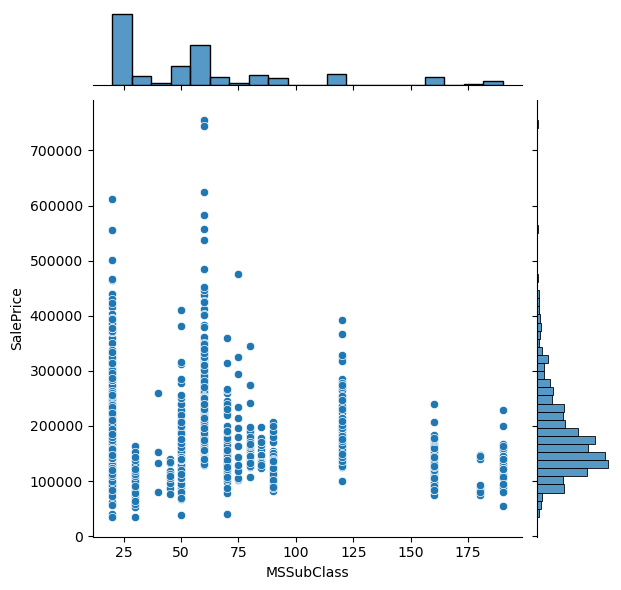

<Figure size 2000x2600 with 0 Axes>

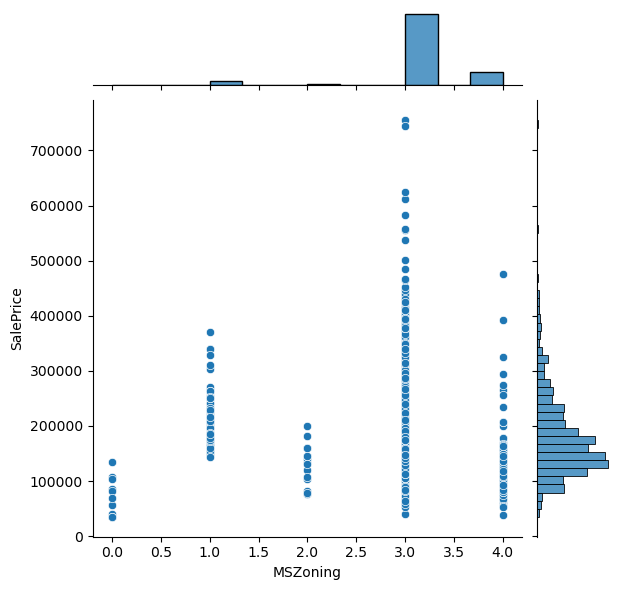

<Figure size 2000x2600 with 0 Axes>

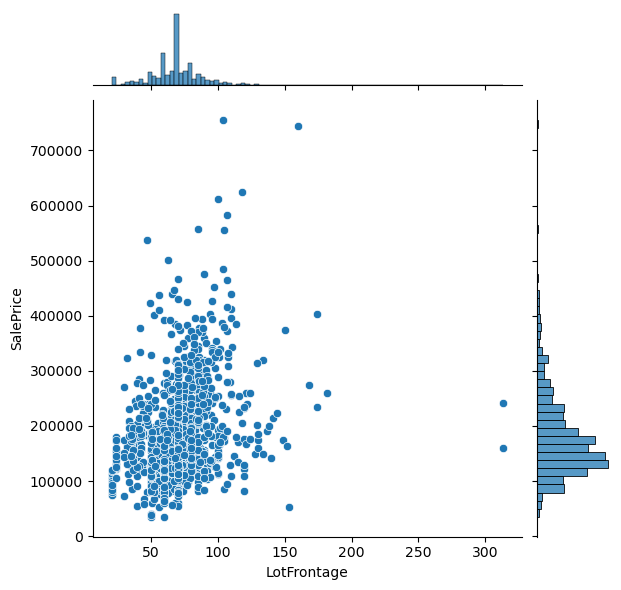

<Figure size 2000x2600 with 0 Axes>

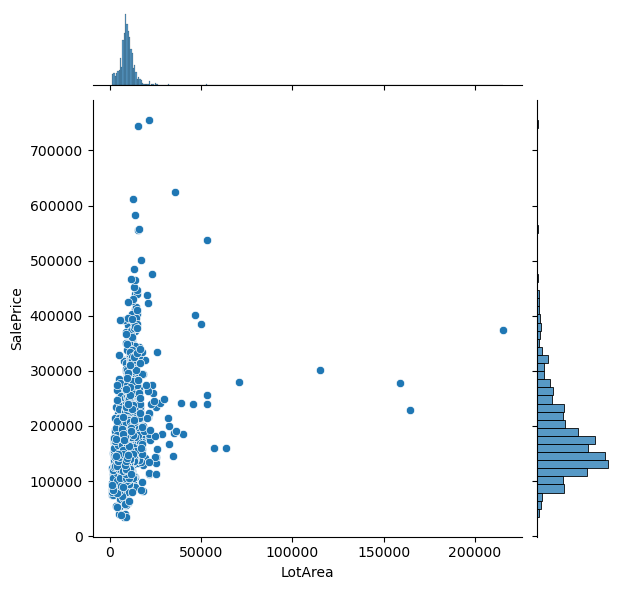

<Figure size 2000x2600 with 0 Axes>

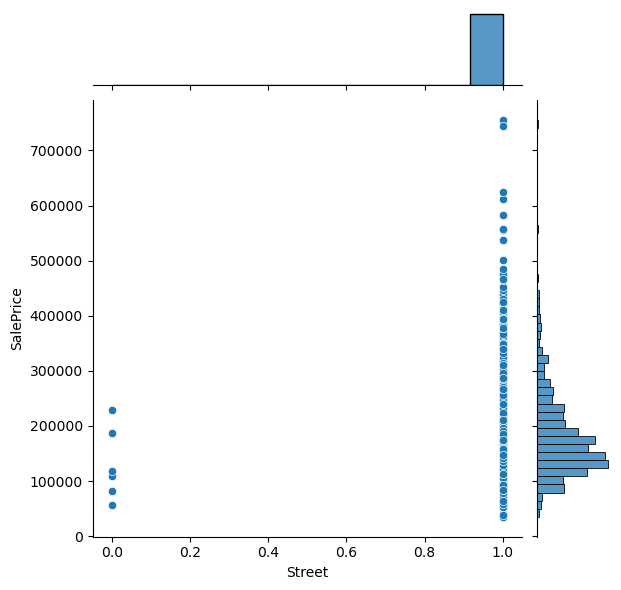

<Figure size 2000x2600 with 0 Axes>

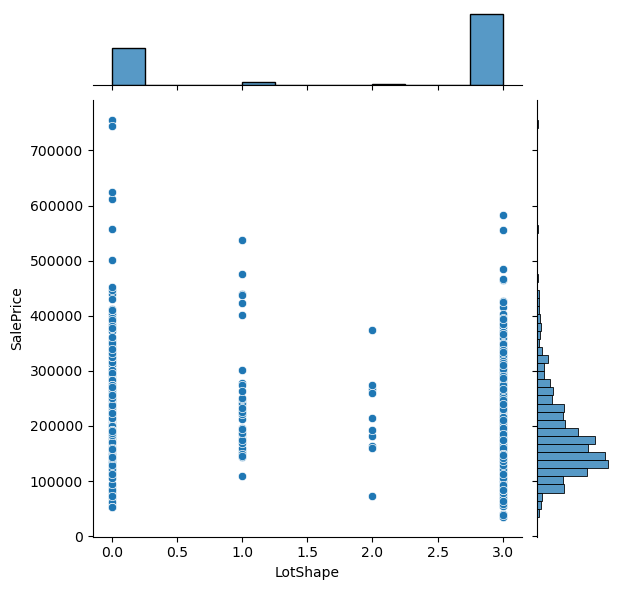

<Figure size 2000x2600 with 0 Axes>

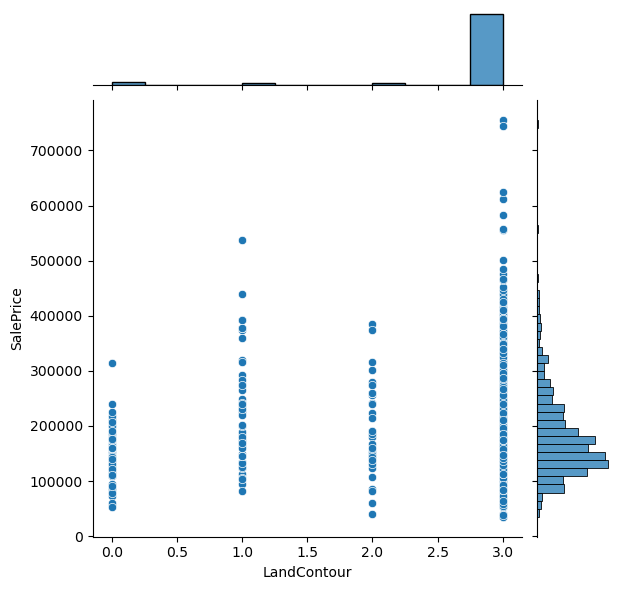

<Figure size 2000x2600 with 0 Axes>

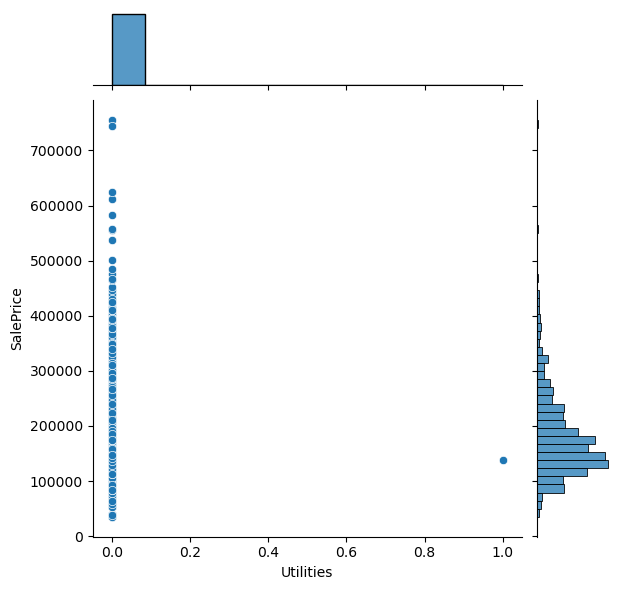

<Figure size 2000x2600 with 0 Axes>

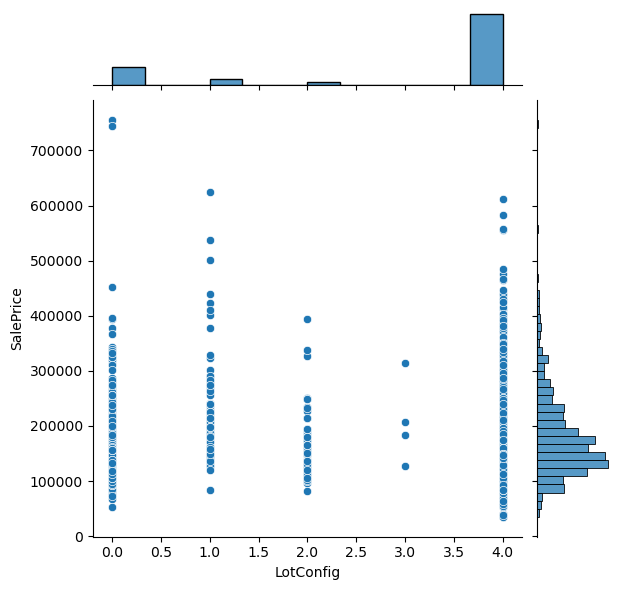

<Figure size 2000x2600 with 0 Axes>

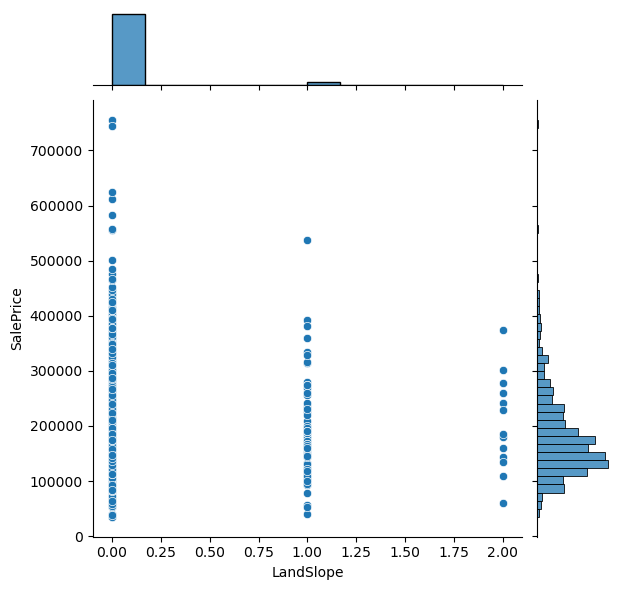

<Figure size 2000x2600 with 0 Axes>

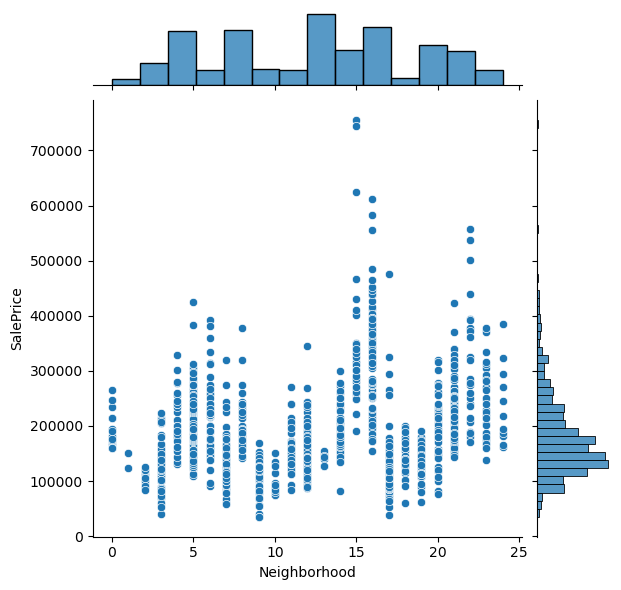

<Figure size 2000x2600 with 0 Axes>

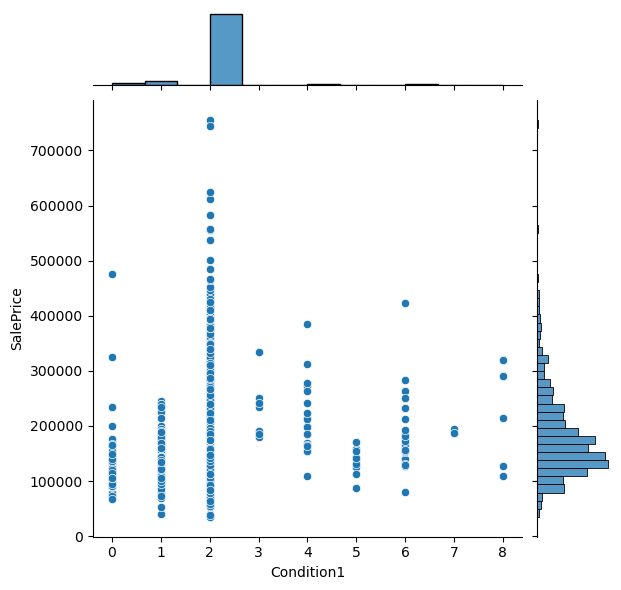

<Figure size 2000x2600 with 0 Axes>

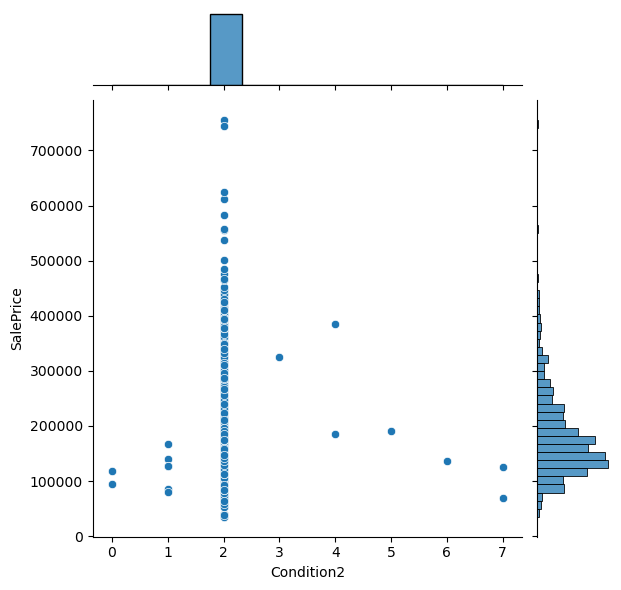

<Figure size 2000x2600 with 0 Axes>

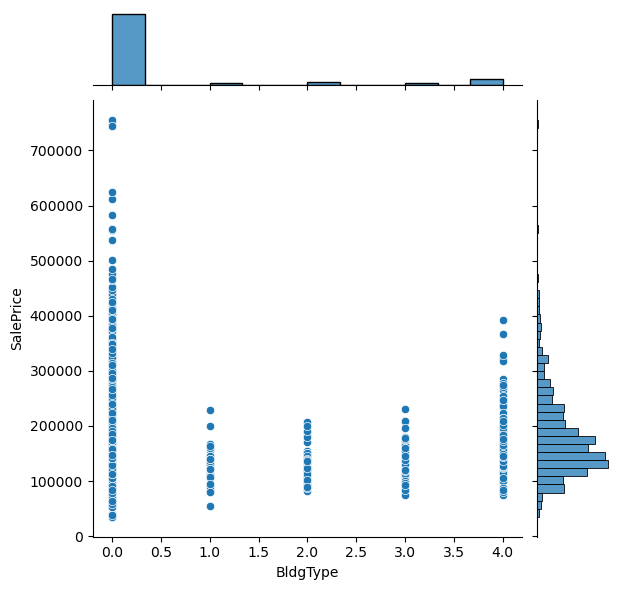

<Figure size 2000x2600 with 0 Axes>

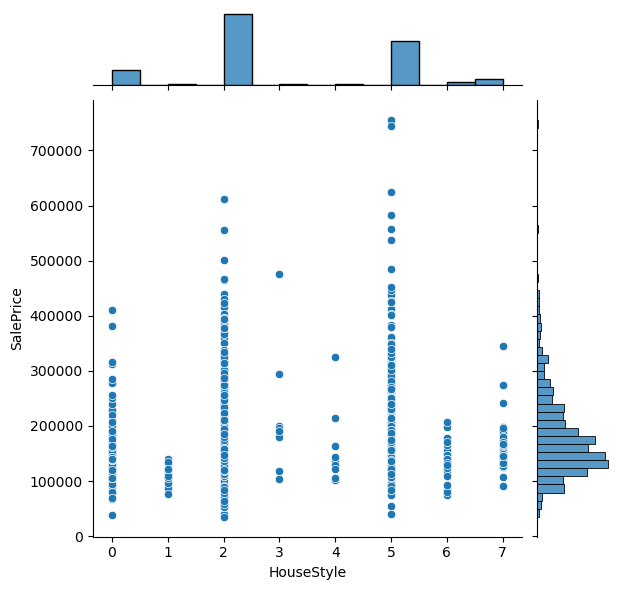

<Figure size 2000x2600 with 0 Axes>

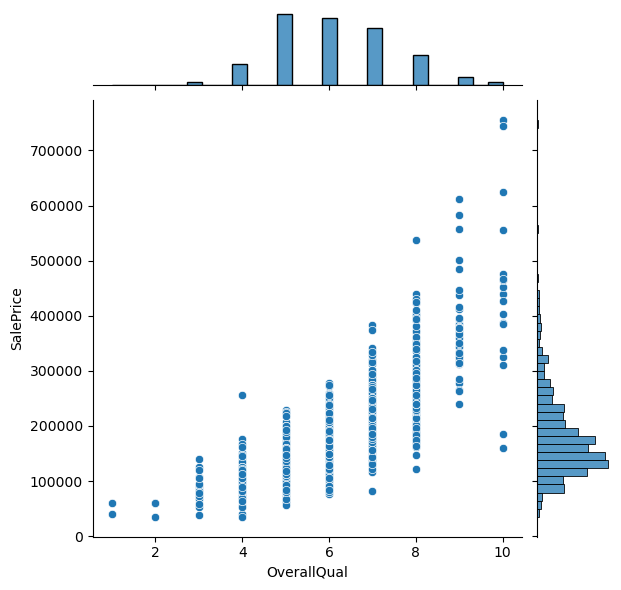

<Figure size 2000x2600 with 0 Axes>

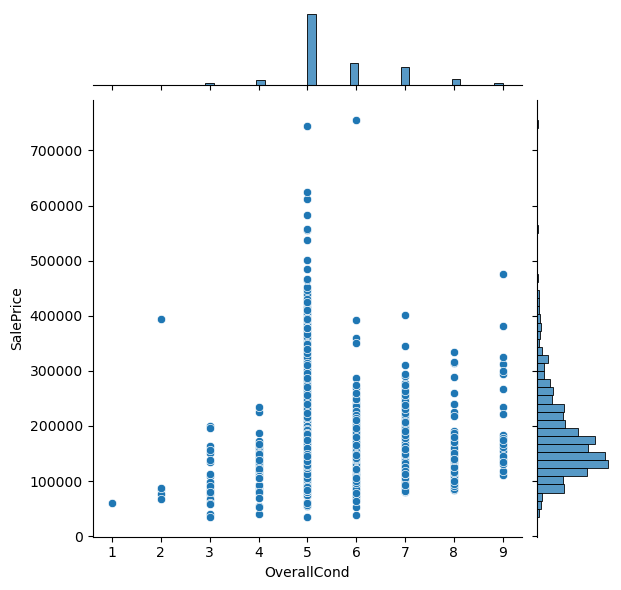

<Figure size 2000x2600 with 0 Axes>

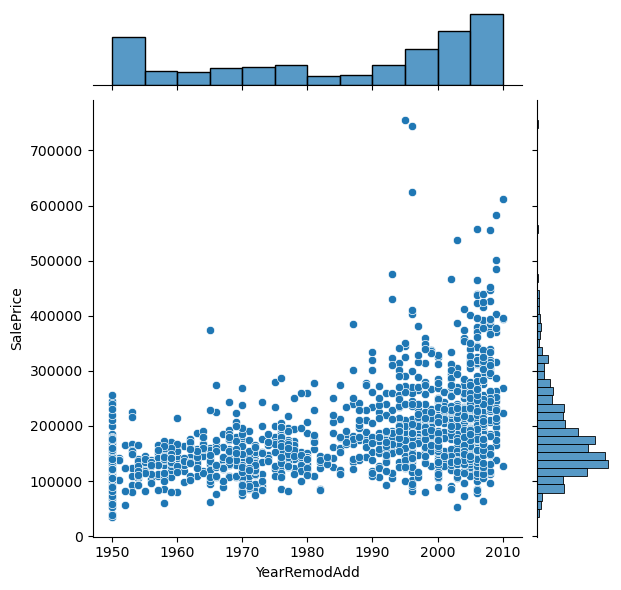

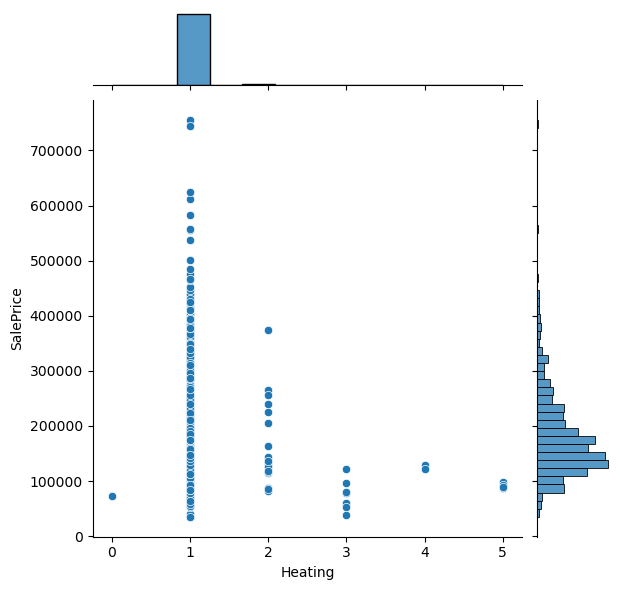

<Figure size 2000x2600 with 0 Axes>

<Figure size 2000x2600 with 0 Axes>

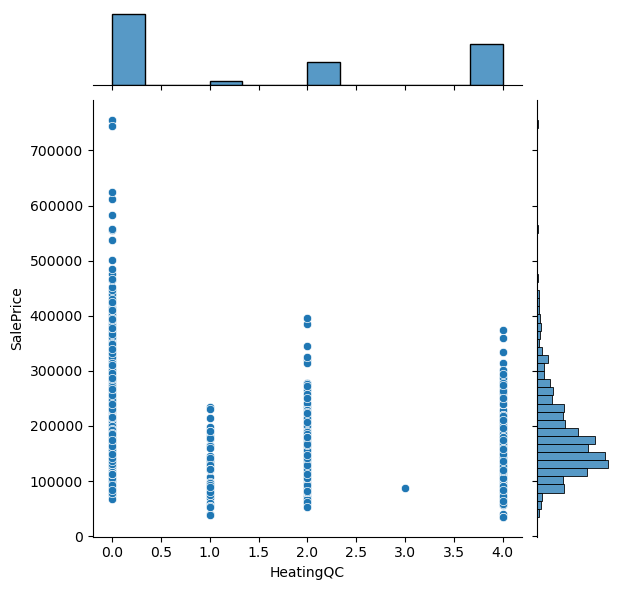

<Figure size 2000x2600 with 0 Axes>

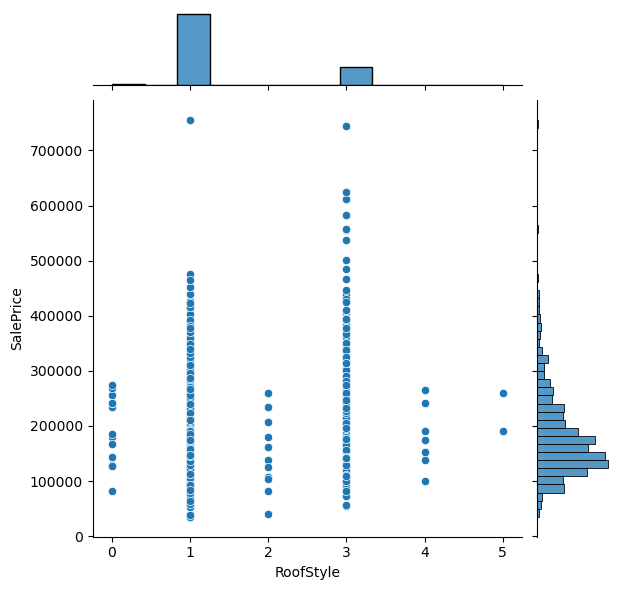

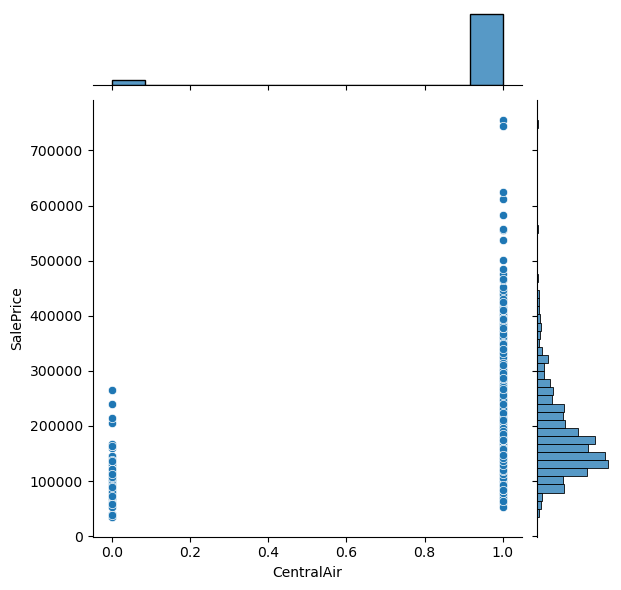

<Figure size 2000x2600 with 0 Axes>

<Figure size 2000x2600 with 0 Axes>

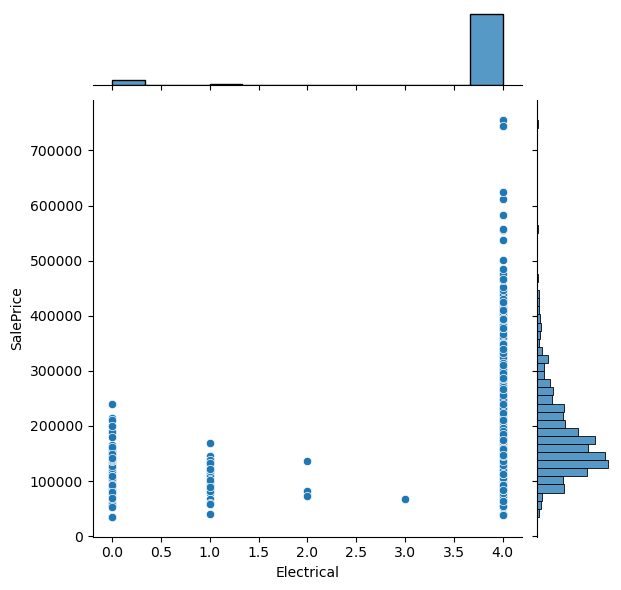

<Figure size 2000x2600 with 0 Axes>

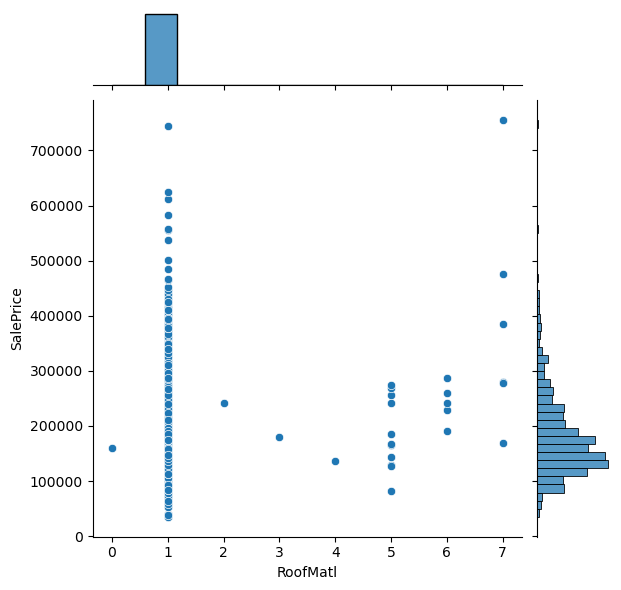

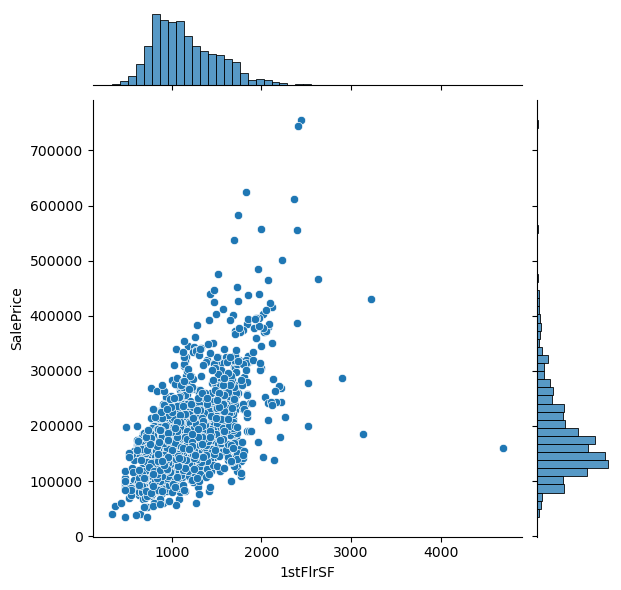

<Figure size 2000x2600 with 0 Axes>

<Figure size 2000x2600 with 0 Axes>

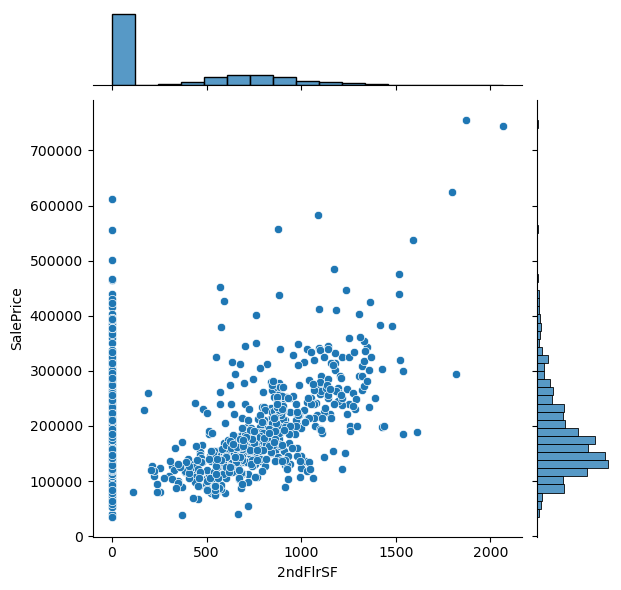

<Figure size 2000x2600 with 0 Axes>

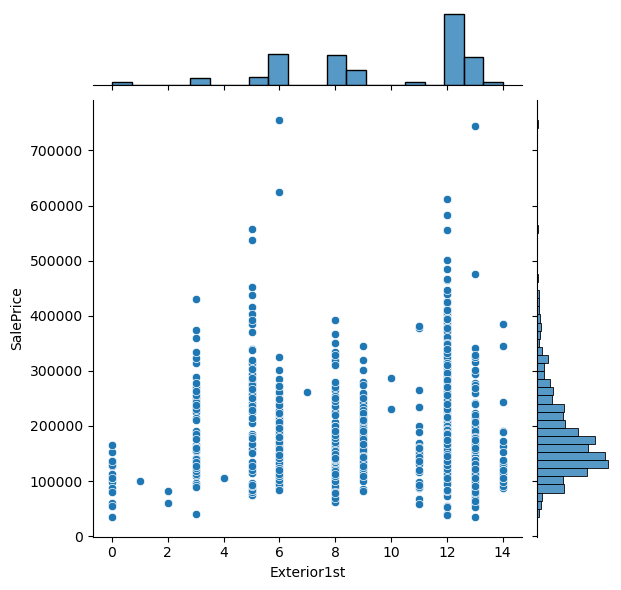

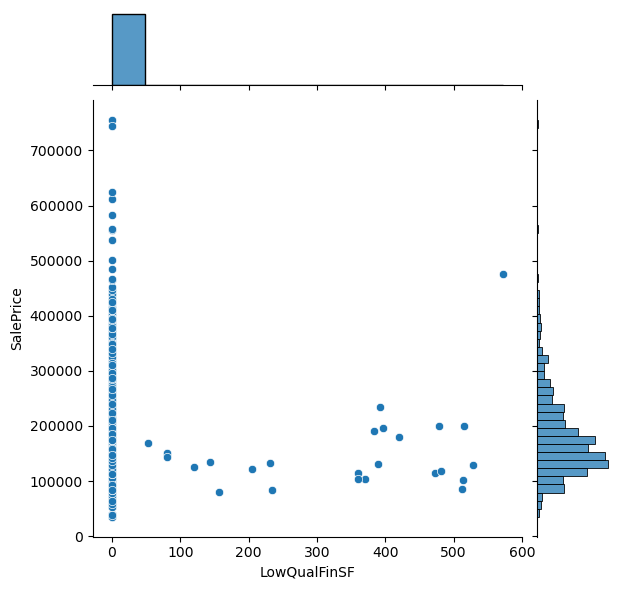

<Figure size 2000x2600 with 0 Axes>

<Figure size 2000x2600 with 0 Axes>

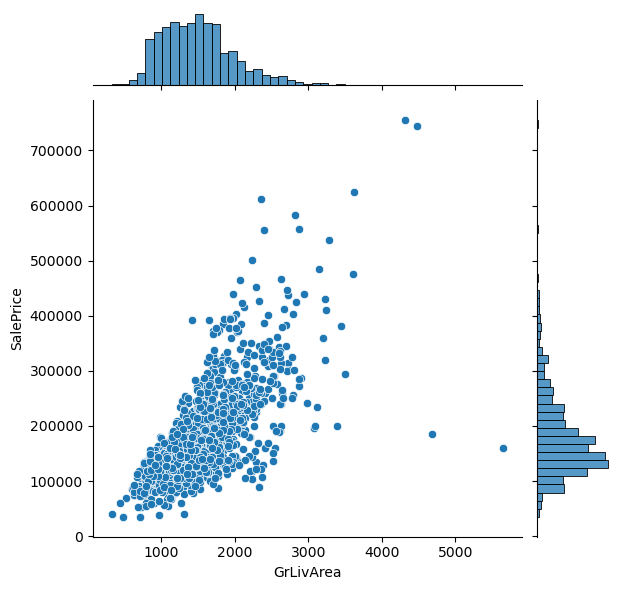

<Figure size 2000x2600 with 0 Axes>

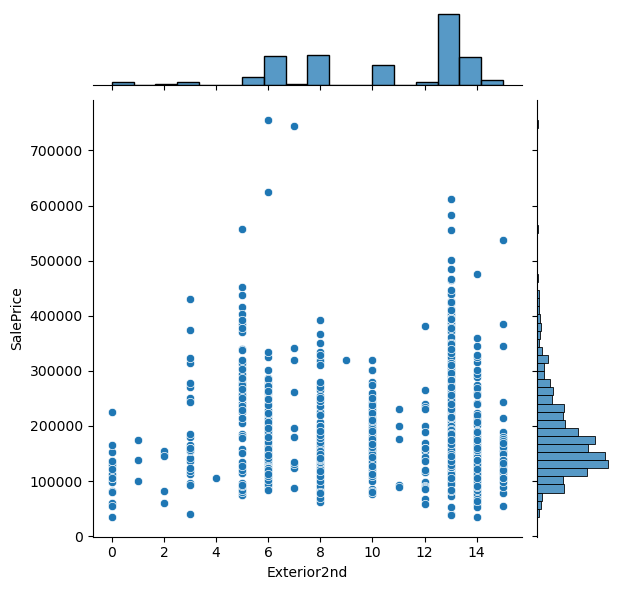

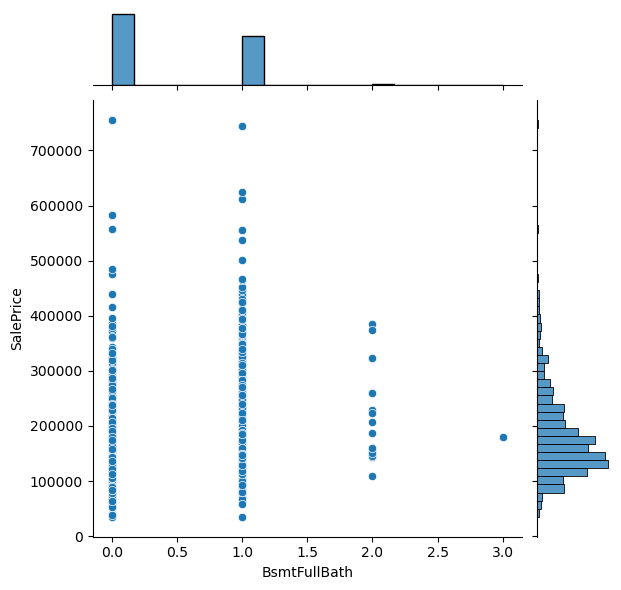

<Figure size 2000x2600 with 0 Axes>

<Figure size 2000x2600 with 0 Axes>

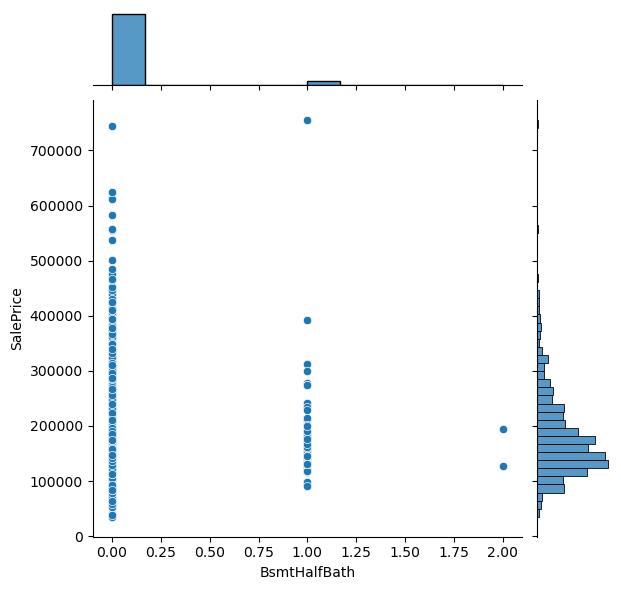

<Figure size 2000x2600 with 0 Axes>

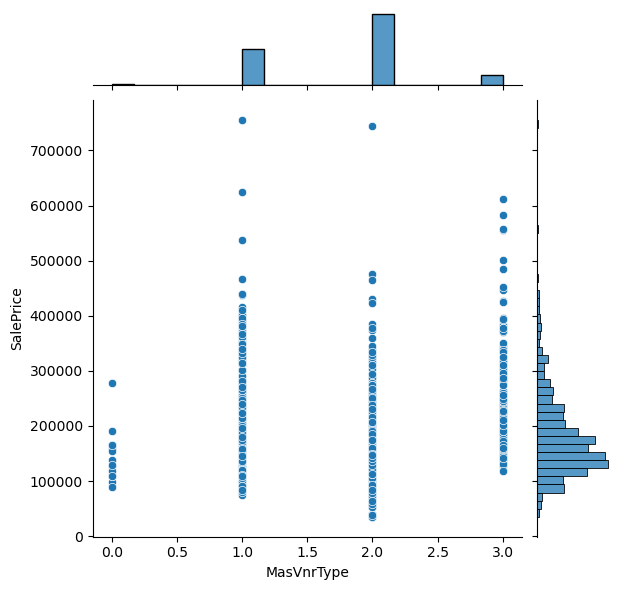

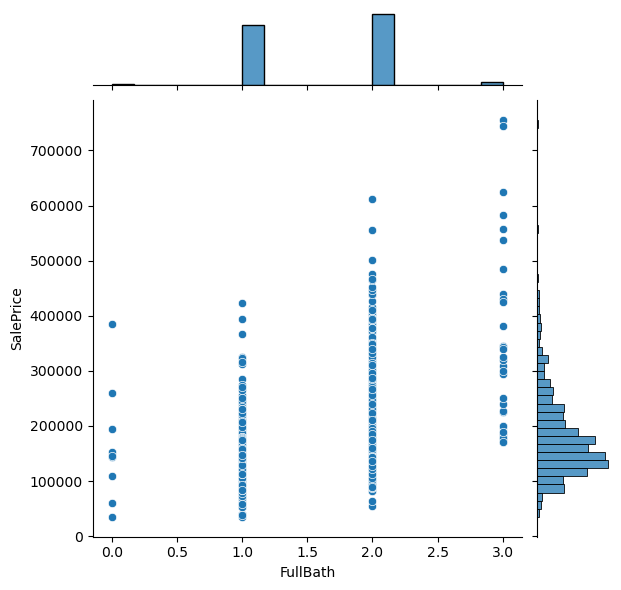

<Figure size 2000x2600 with 0 Axes>

<Figure size 2000x2600 with 0 Axes>

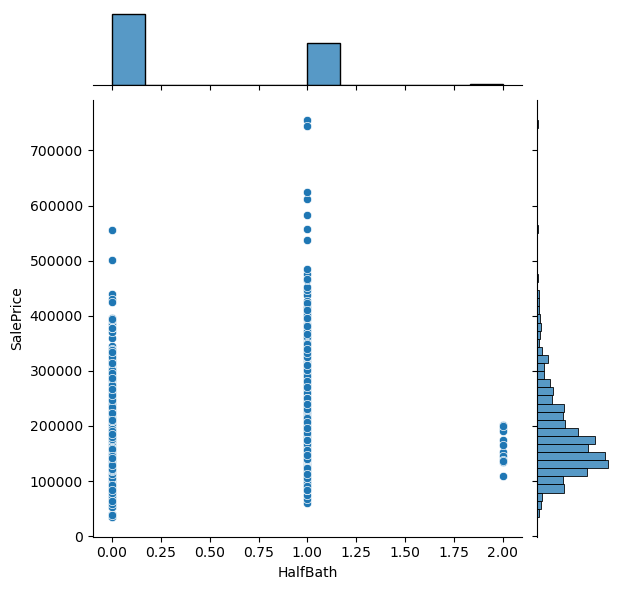

<Figure size 2000x2600 with 0 Axes>

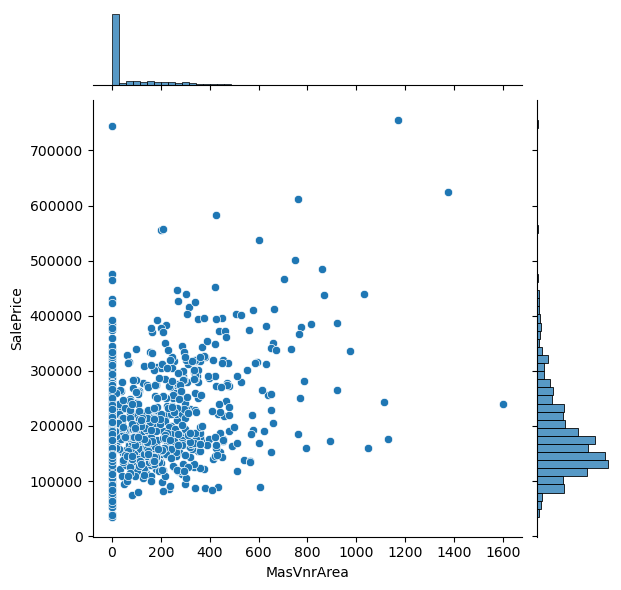

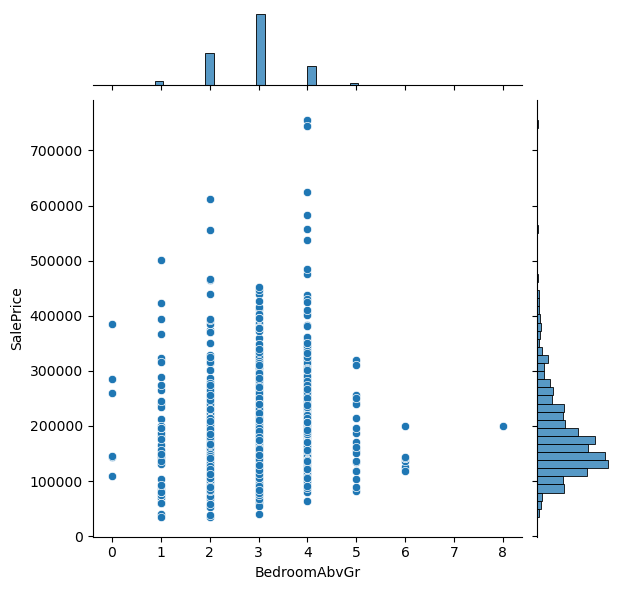

<Figure size 2000x2600 with 0 Axes>

<Figure size 2000x2600 with 0 Axes>

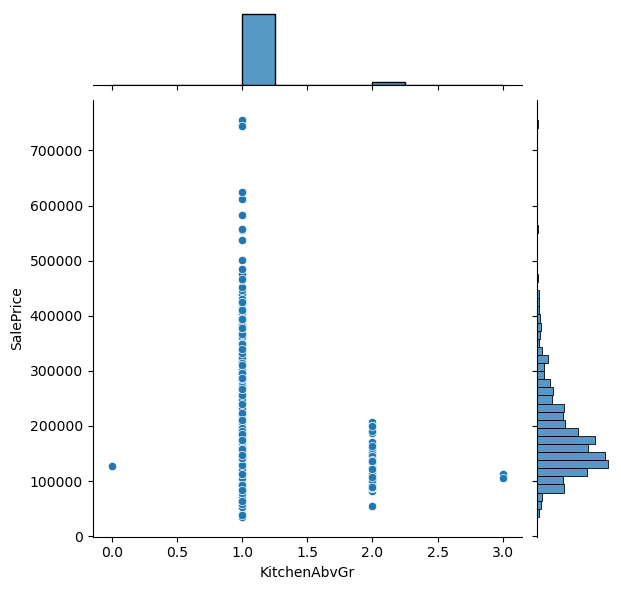

<Figure size 2000x2600 with 0 Axes>

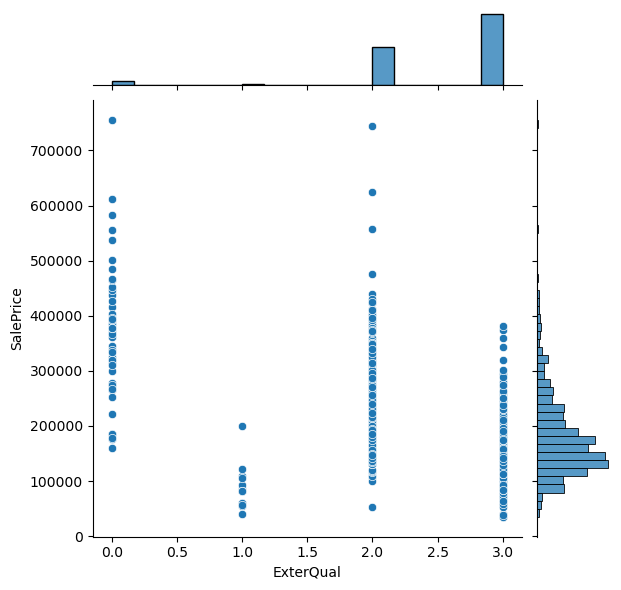

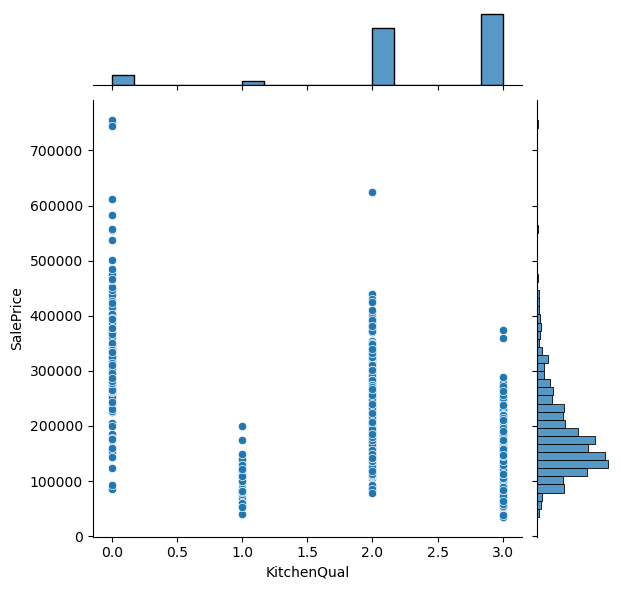

<Figure size 2000x2600 with 0 Axes>

<Figure size 2000x2600 with 0 Axes>

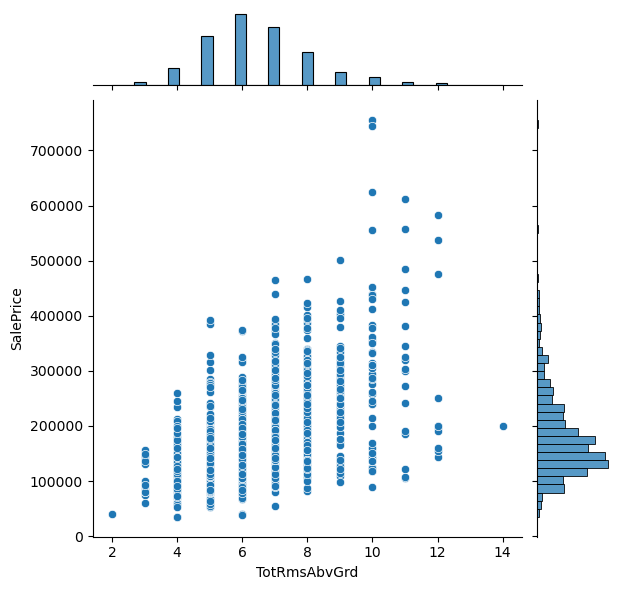

<Figure size 2000x2600 with 0 Axes>

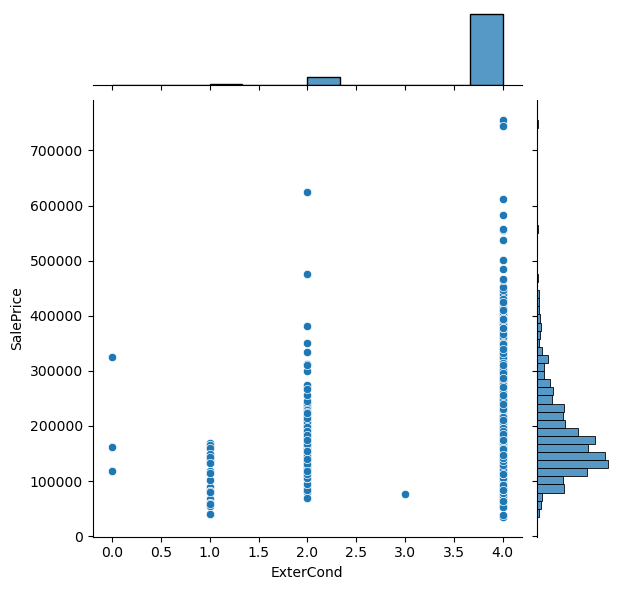

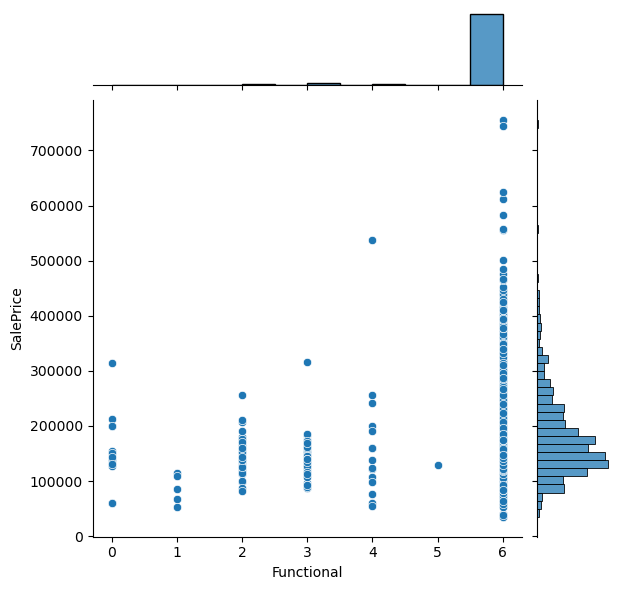

<Figure size 2000x2600 with 0 Axes>

<Figure size 2000x2600 with 0 Axes>

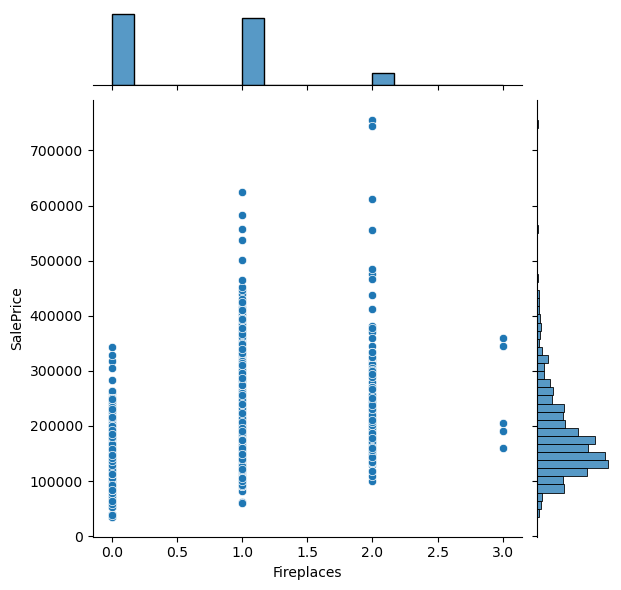

<Figure size 2000x2600 with 0 Axes>

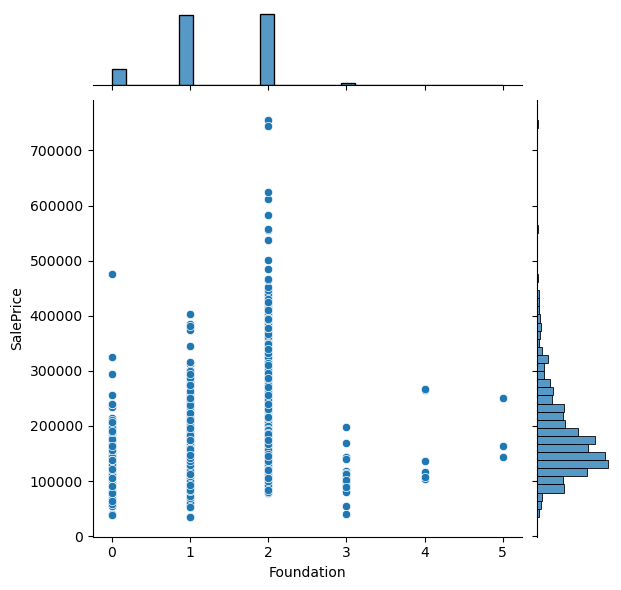

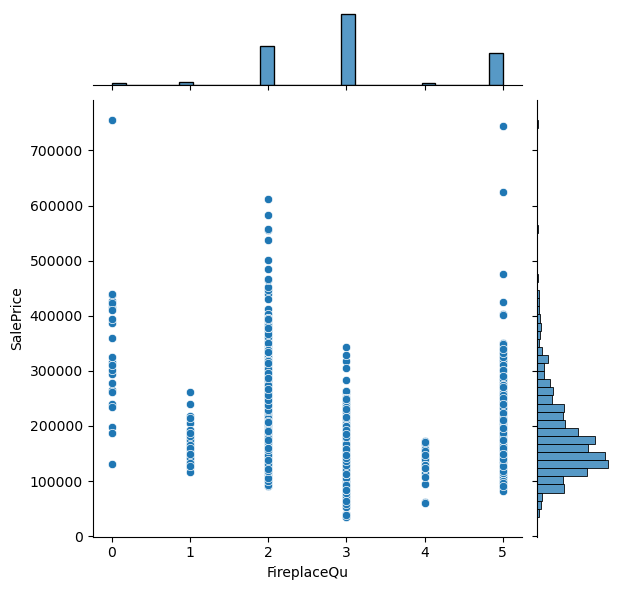

<Figure size 2000x2600 with 0 Axes>

<Figure size 2000x2600 with 0 Axes>

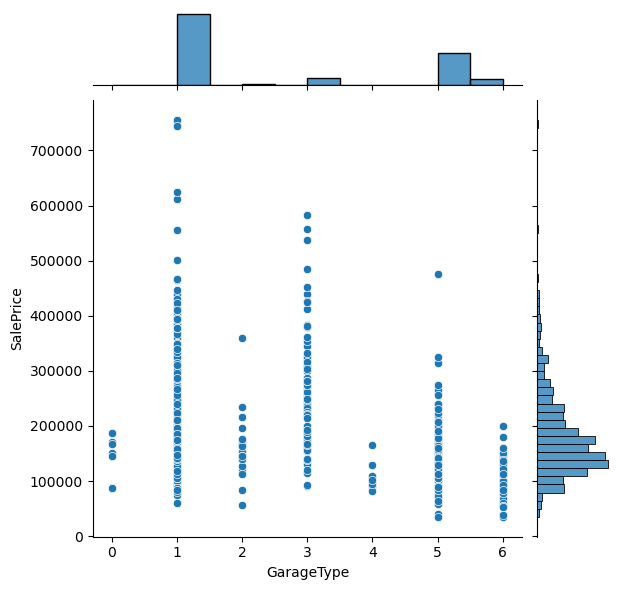

<Figure size 2000x2600 with 0 Axes>

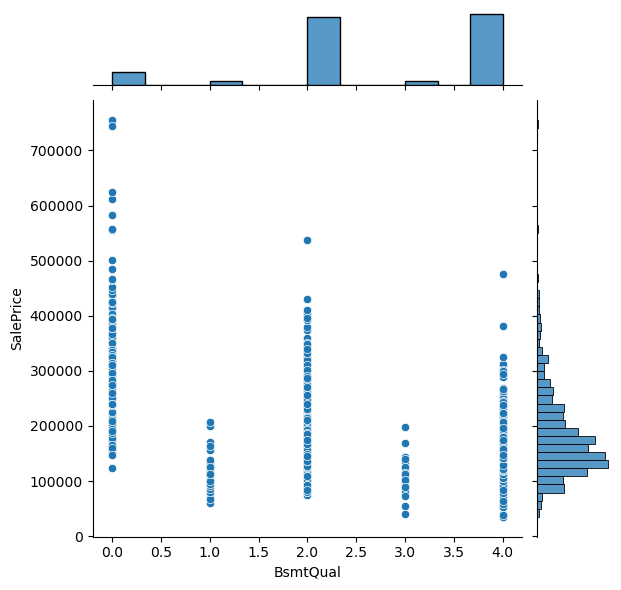

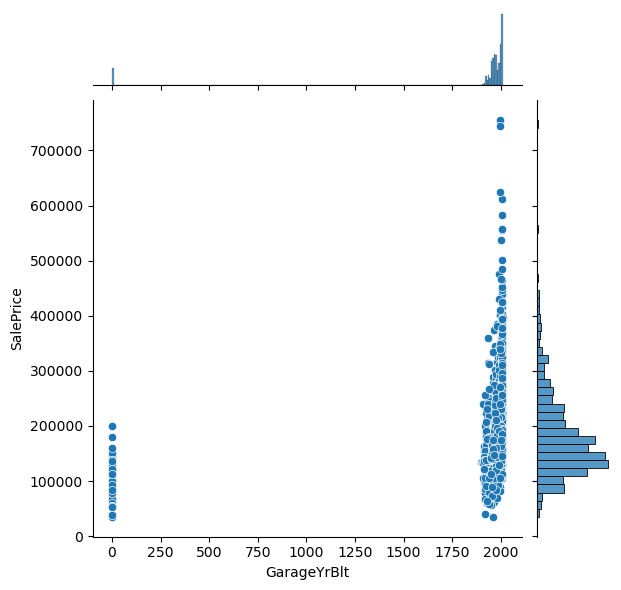

<Figure size 2000x2600 with 0 Axes>

<Figure size 2000x2600 with 0 Axes>

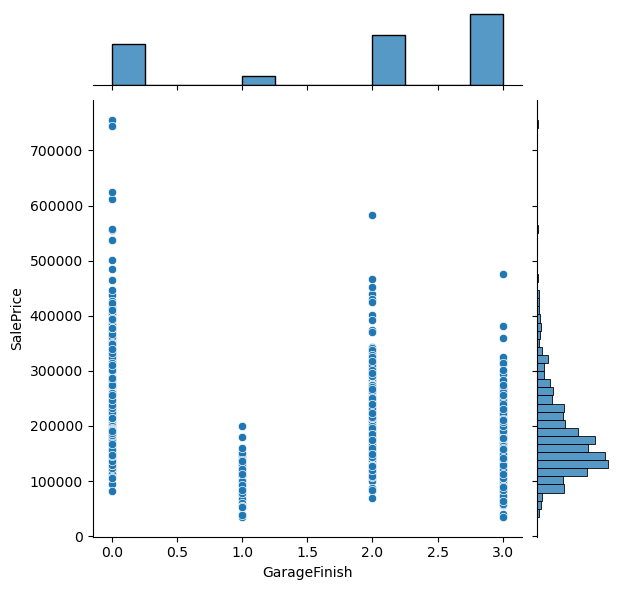

<Figure size 2000x2600 with 0 Axes>

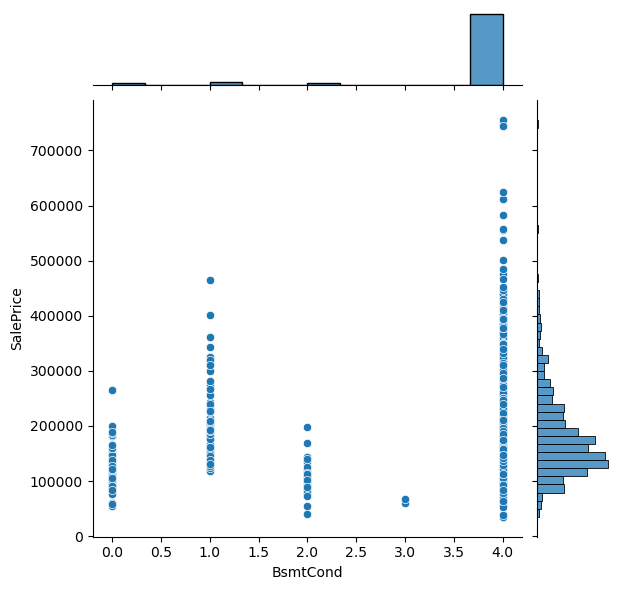

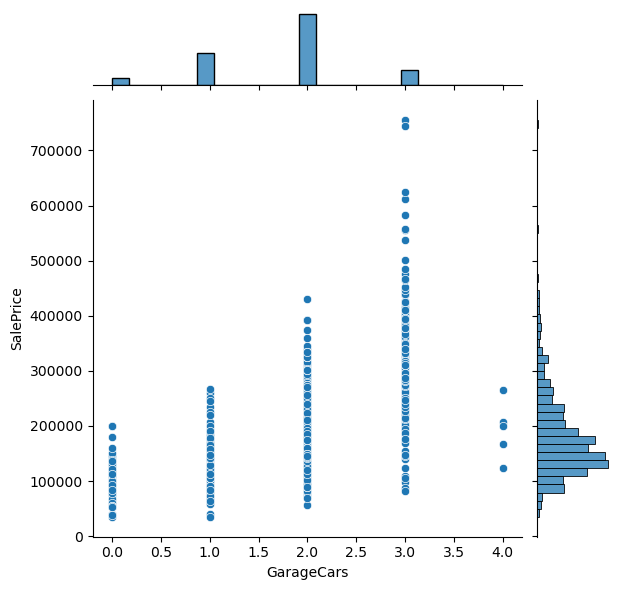

<Figure size 2000x2600 with 0 Axes>

<Figure size 2000x2600 with 0 Axes>

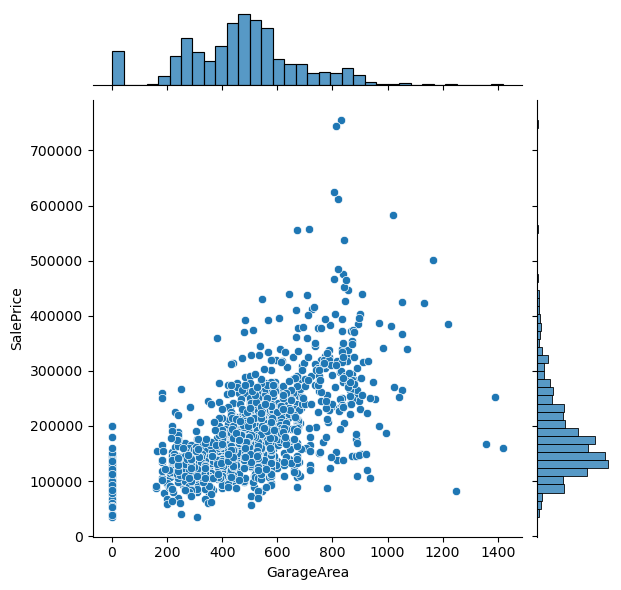

<Figure size 2000x2600 with 0 Axes>

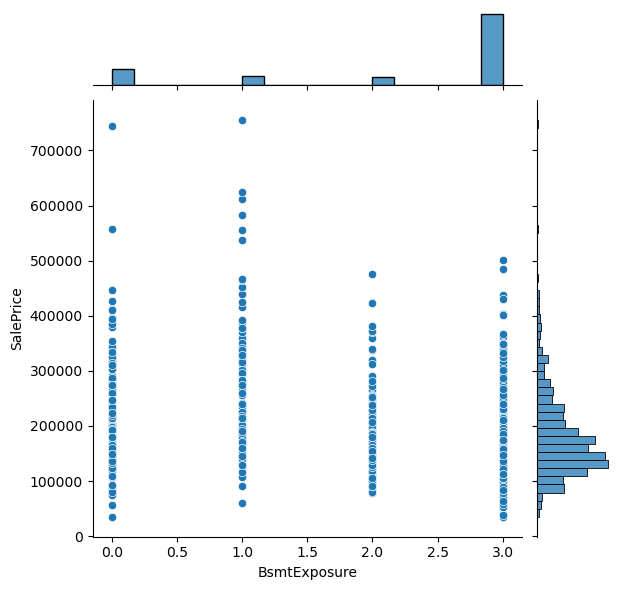

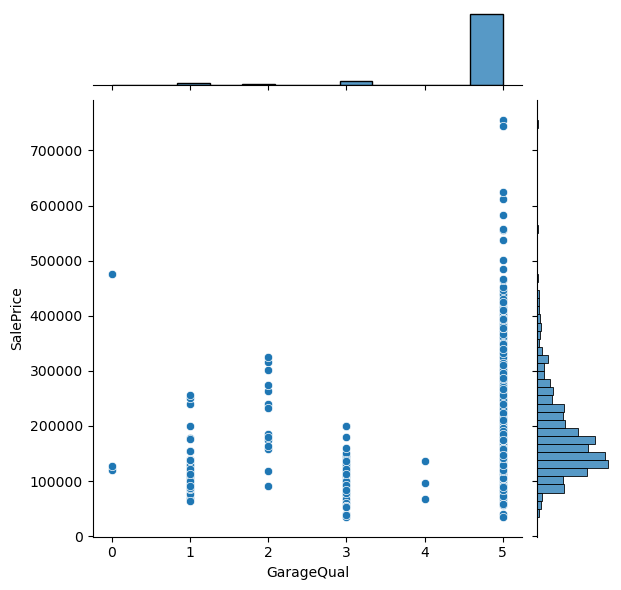

<Figure size 2000x2600 with 0 Axes>

<Figure size 2000x2600 with 0 Axes>

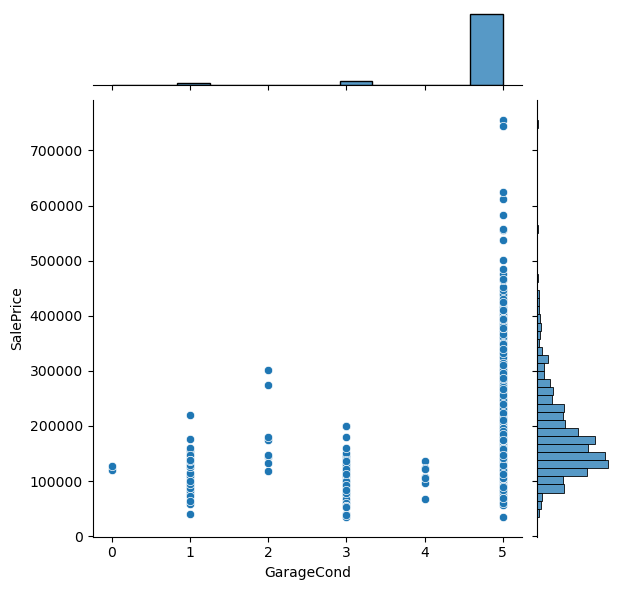

<Figure size 2000x2600 with 0 Axes>

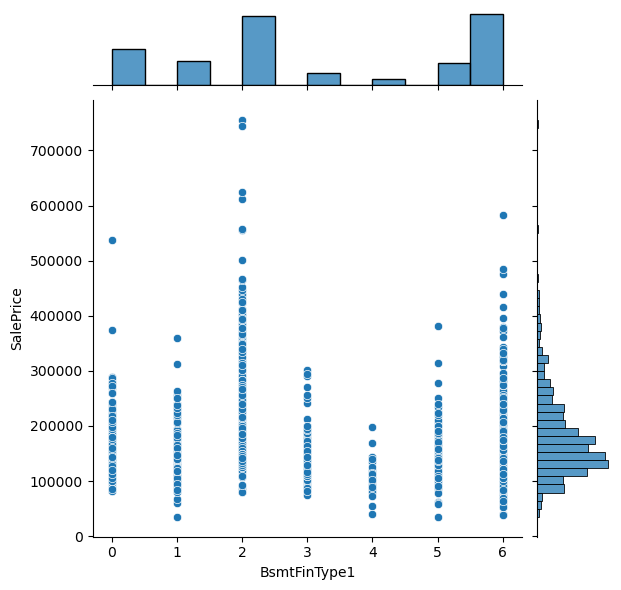

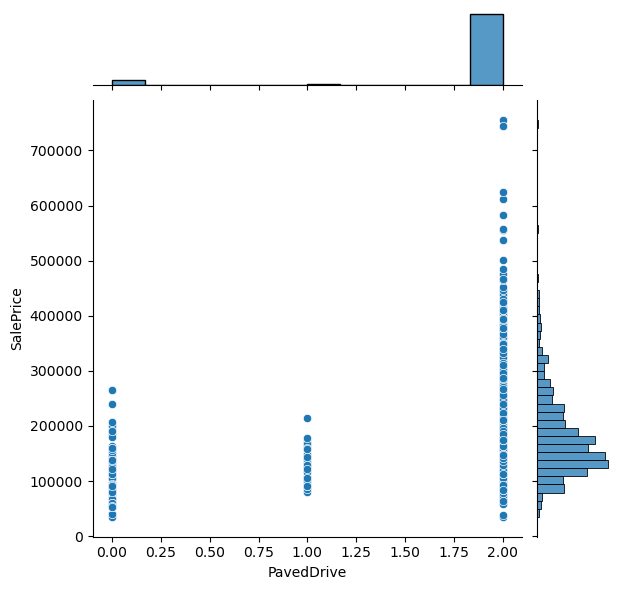

<Figure size 2000x2600 with 0 Axes>

<Figure size 2000x2600 with 0 Axes>

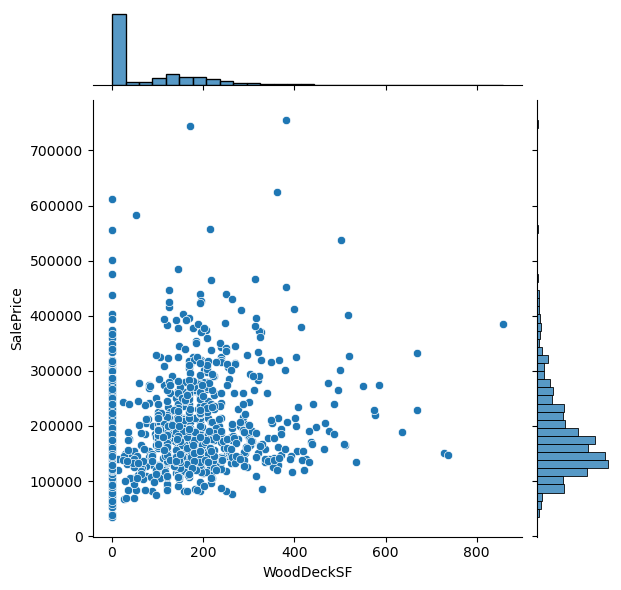

<Figure size 2000x2600 with 0 Axes>

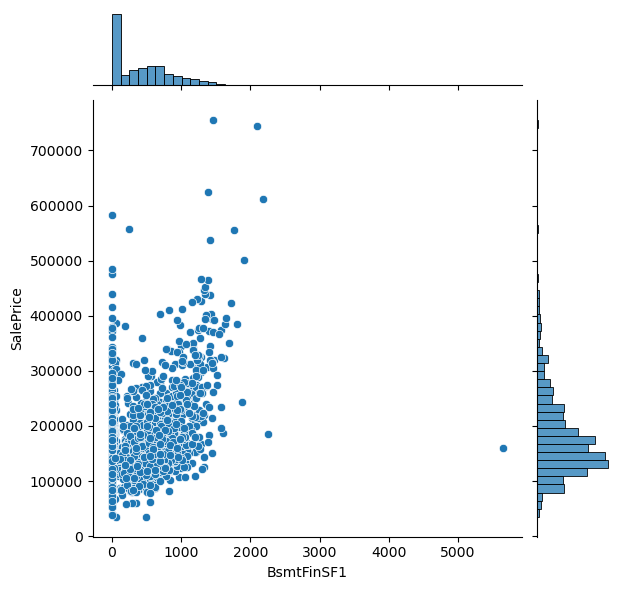

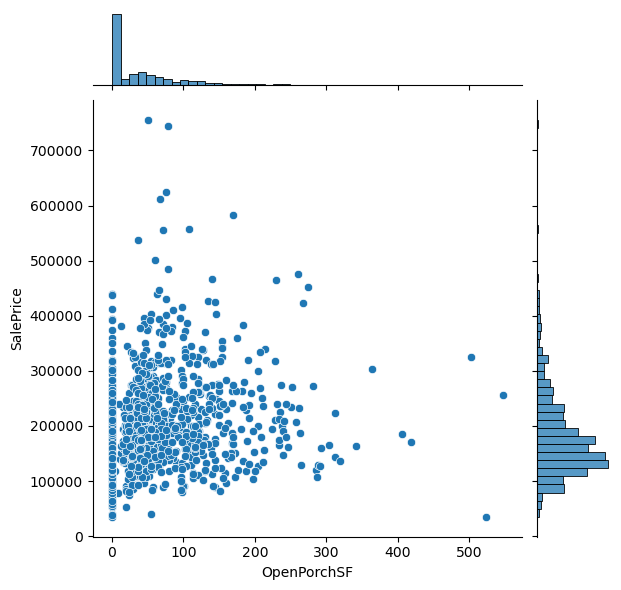

<Figure size 2000x2600 with 0 Axes>

<Figure size 2000x2600 with 0 Axes>

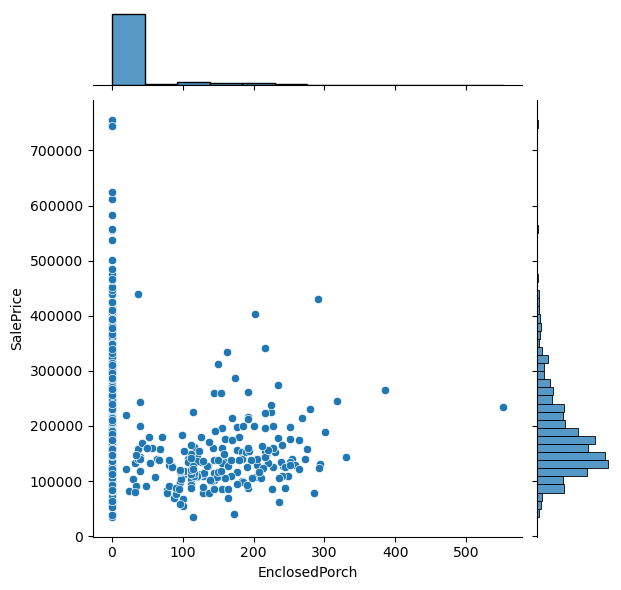

<Figure size 2000x2600 with 0 Axes>

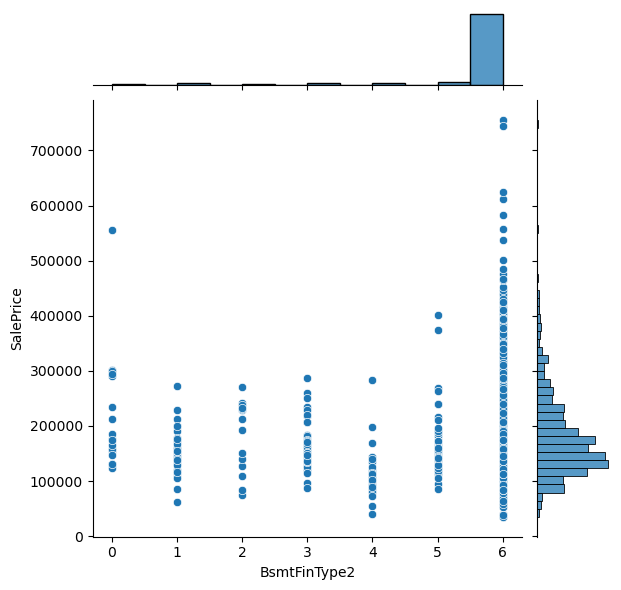

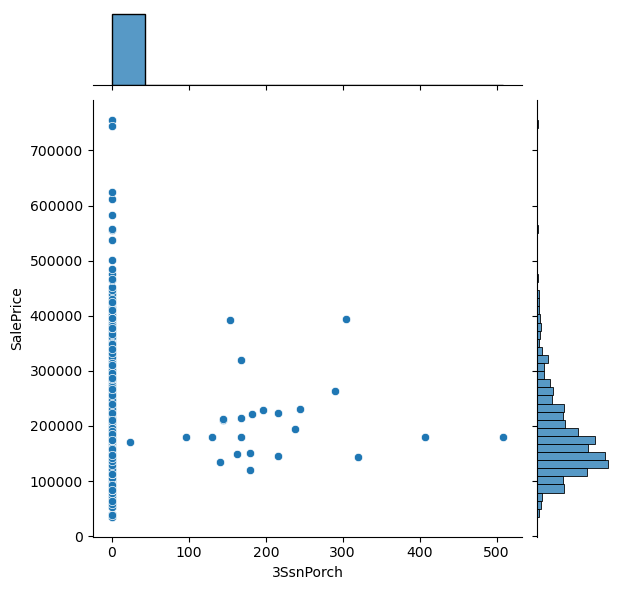

<Figure size 2000x2600 with 0 Axes>

<Figure size 2000x2600 with 0 Axes>

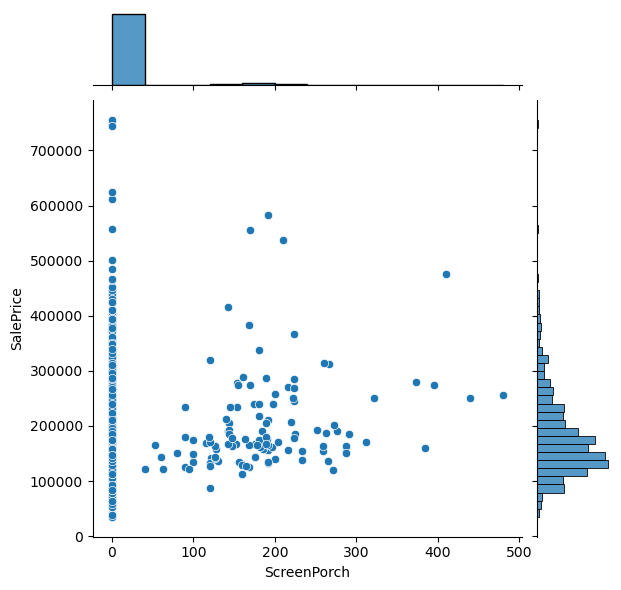

<Figure size 2000x2600 with 0 Axes>

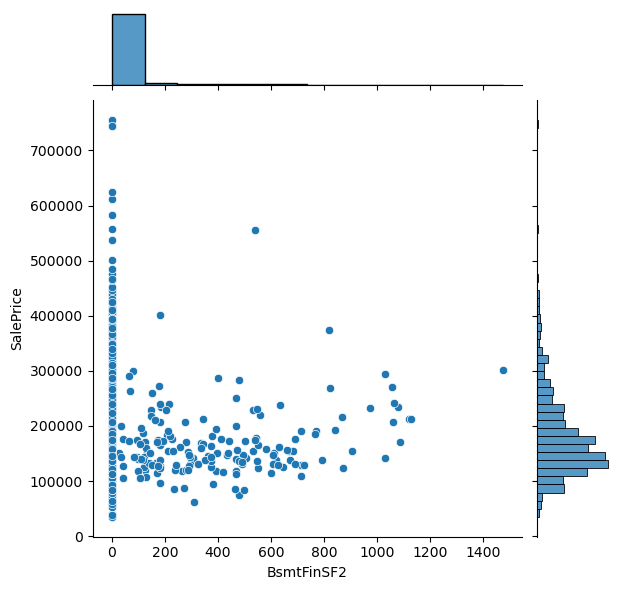

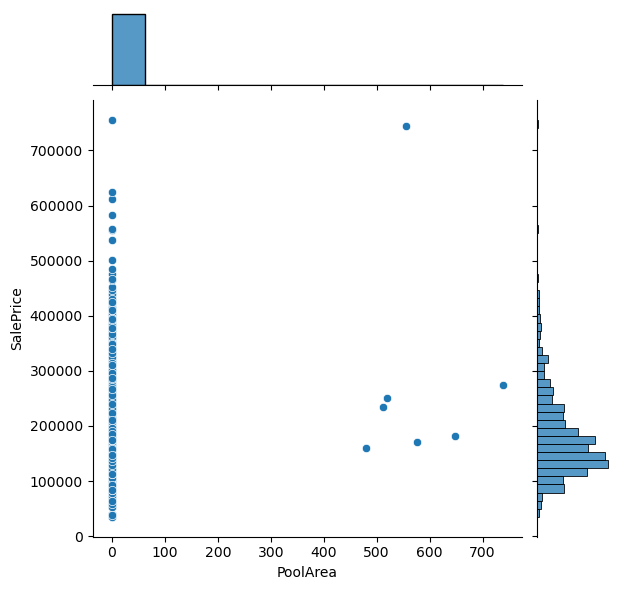

<Figure size 2000x2600 with 0 Axes>

<Figure size 2000x2600 with 0 Axes>

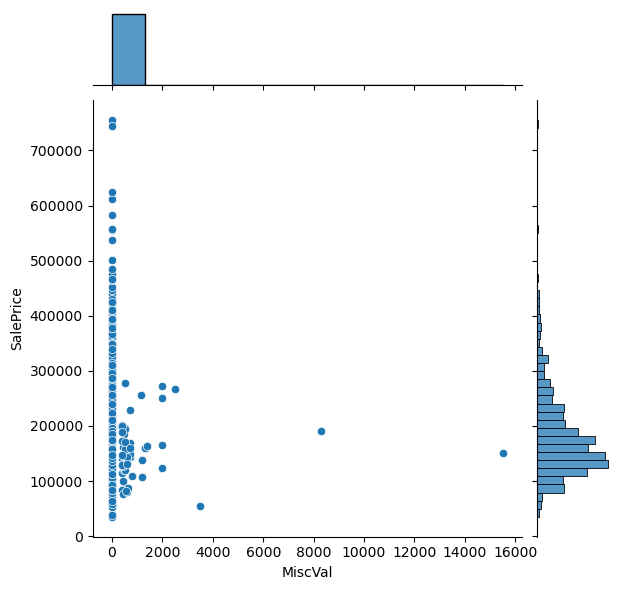

<Figure size 2000x2600 with 0 Axes>

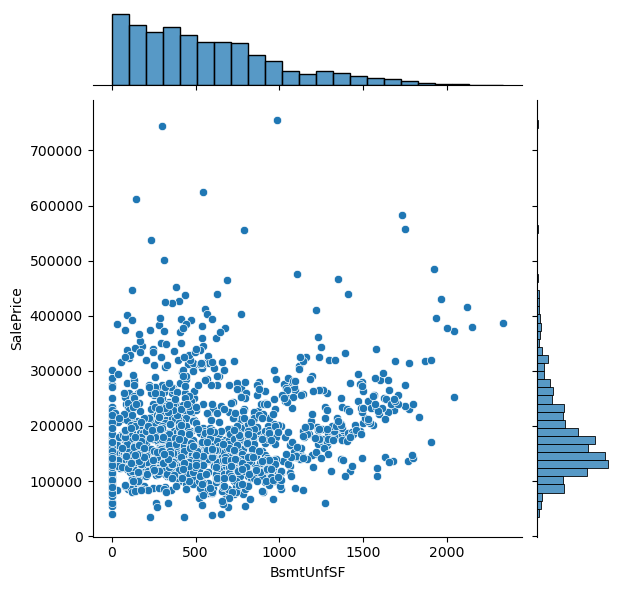

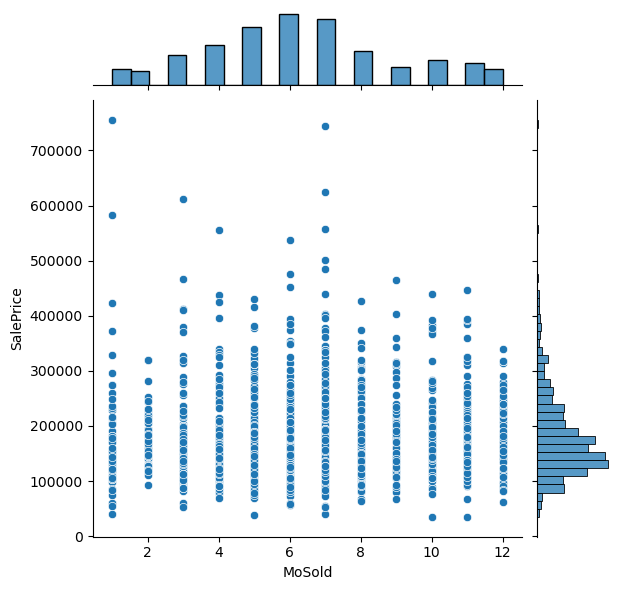

<Figure size 2000x2600 with 0 Axes>

<Figure size 2000x2600 with 0 Axes>

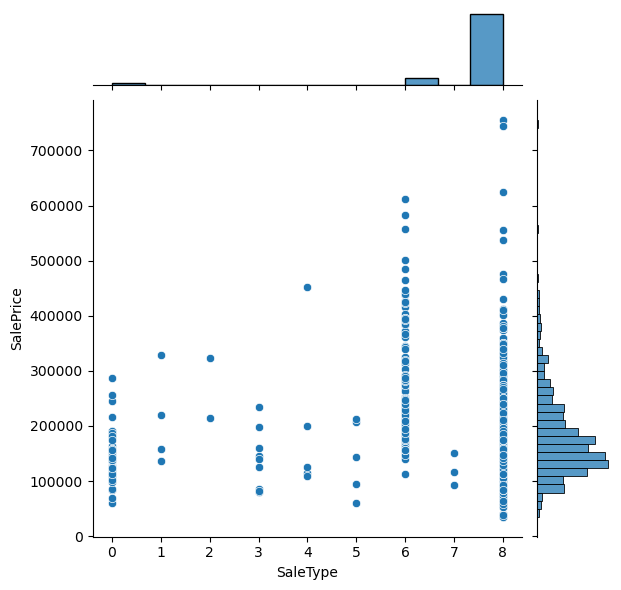

<Figure size 2000x2600 with 0 Axes>

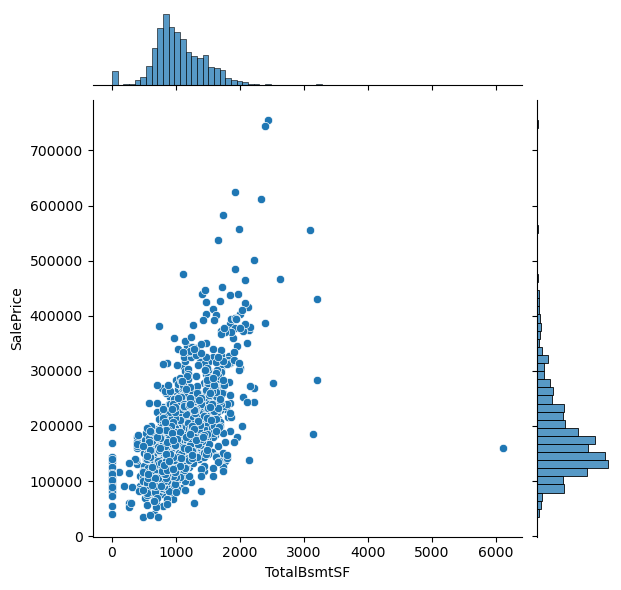

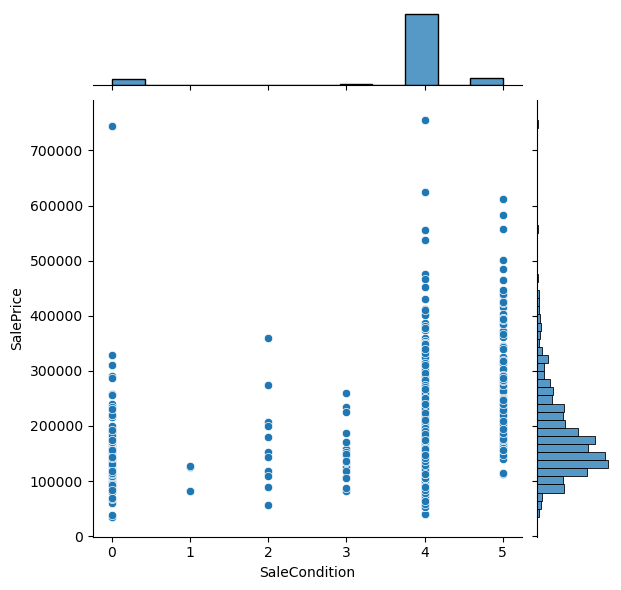

<Figure size 2000x2600 with 0 Axes>

<Figure size 2000x2600 with 0 Axes>

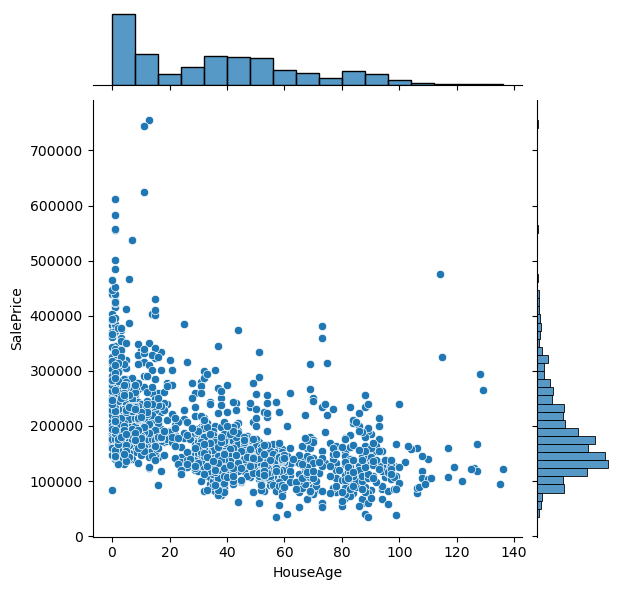

In [114]:
#Get all numerical Columns
numerical_cols = housing_data.select_dtypes(include = np.number).columns.tolist()
numerical_cols.remove('SalePrice')

#Ploting scatter for all other cloumns
for index, col in enumerate(numerical_cols):
    numericRelationAnalysis(housing_data, index, col, 'SalePrice')

In [117]:
# #check the correaltion of columns
plt.figure(figsize=(200,200))
sns.heatmap(housing_data.corr(), annot =True, cmap="YlGnBu")
plt.show()

In [118]:
housing_data.corr()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SaleType,SaleCondition,SalePrice,HouseAge
MSSubClass,1.000000,0.035900,-3.570559e-01,-0.139781,-0.024969,0.119289,-0.002940,-2.284384e-02,0.075910,-0.025672,-0.005985,-0.024762,-0.042395,0.746063,0.397161,0.032628,-0.059316,0.040581,-0.117817,-0.031336,-0.089159,-0.137229,-0.029850,0.023573,-0.017161,-0.003254,0.058126,-0.081702,-0.017905,-0.064221,0.006437,-0.069836,0.037025,-0.065649,-0.140759,-0.238518,0.048009,0.020760,-0.101774,0.051945,-0.251758,0.307886,0.046474,0.074853,0.003491,-0.002333,0.131608,0.177354,-0.023438,0.281721,0.010129,0.040380,0.003711,-0.045569,0.050200,0.133138,-0.080997,-0.028806,-0.040110,-0.098672,-0.038571,-0.045895,-0.059925,-0.012579,-0.006100,-0.012037,-0.043825,-0.026030,0.008283,-0.007683,-0.013585,0.012464,-0.024940,-0.084284,-0.028746
MSZoning,0.035900,1.000000,-1.063635e-01,-0.034452,0.087654,0.061887,-0.017854,-1.192034e-03,-0.009895,-0.022055,-0.249679,-0.027874,0.044606,0.005690,-0.105315,-0.160099,0.186951,-0.174728,-0.000301,0.005133,-0.008558,0.006963,-0.028279,-0.062830,0.200536,-0.096041,-0.235174,0.160778,-0.011450,0.037209,0.026347,-0.049128,-0.034004,0.028086,-0.046749,-0.087834,0.056866,0.134279,-0.049523,-0.070818,-0.055614,-0.051481,0.011520,-0.082615,-0.018526,0.007193,-0.198290,-0.133876,-0.016471,0.049434,0.128976,-0.043200,-0.095722,-0.011349,-0.002491,0.141142,-0.073915,0.117559,-0.157042,-0.189250,-0.162998,-0.102744,-0.100366,-0.009477,-0.154704,0.115509,0.000362,0.019089,-0.003128,0.009293,-0.031496,0.097437,0.009494,-0.166872,0.307520
LotFrontage,-0.357056,-0.106363,1.000000e+00,0.306795,-0.037323,-0.144931,-0.075647,-5.447825e-18,-0.181253,0.067608,0.084545,-0.008483,0.003214,-0.408564,0.031907,0.234196,-0.052820,0.082746,0.153467,0.082026,0.074448,0.098756,-0.020220,0.178699,-0.183293,0.047951,0.098809,-0.139701,0.055936,-0.124127,-0.023136,0.215828,-0.017142,0.043340,0.122156,0.363358,-0.020815,-0.079975,0.068666,0.060213,0.414266,0.072483,0.036849,0.368392,0.091481,-0.006419,0.180424,0.048258,0.237023,-0.005805,-0.189082,0.320146,0.030250,0.235755,-0.016492,-0.255709,0.100259,-0.155136,0.269729,0.323663,0.094808,0.091630,0.089073,0.077106,0.137454,0.009790,0.062335,0.037684,0.180868,0.001168,0.010158,-0.030846,0.058464,0.334901,-0.117117
LotArea,-0.139781,-0.034452,3.067946e-01,1.000000,-0.197131,-0.165315,-0.149083,1.012318e-02,-0.121161,0.436868,0.044569,0.023846,0.022164,-0.205721,-0.033190,0.105806,-0.005636,0.013788,0.077054,0.149837,0.004256,-0.003930,-0.008122,0.103321,-0.057275,0.015160,-0.011081,-0.061495,0.016715,-0.141043,-0.057081,0.214103,-0.056425,0.111170,-0.002618,0.260833,0.028158,0.004212,0.049755,0.043856,0.299475,0.050986,0.004779,0.263116,0.158155,0.048046,0.126031,0.014259,0.119690,-0.017784,-0.057018,0.190015,-0.022317,0.271364,0.005323,-0.150162,0.072599,-0.087669,0.154871,0.180403,0.053079,0.065741,0.015134,0.171698,0.084774,-0.018340,0.020423,0.043160,0.077672,0.038068,0.001205,0.012292,0.034169,0.263843,-0.014832
Street,-0.024969,0.087654,-3.732277e-02,-0.197131,1.000000,-0.010224,0.115995,1.681767e-03,0.013960,-0.179360,-0.011561,-0.071657,0.002039,-0.018243,0.023704,0.058823,0.042848,0.065465,-0.019732,0.008081,0.002505,0.006166,0.010007,0.017108,0.049976,0.005874,0.035277,-0.0

In [74]:
df_train_test, df_val = train_test_split(housing_data,train_size = 0.8,test_size = 0.2, random_state = 49)

### Scaling

In [75]:
scaler = MinMaxScaler()
df_train_test.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SaleType,SaleCondition,SalePrice,HouseAge
1187,20,3,89.0,12461,1,3,3,0,0,0,15,2,2,0,2,8,5,1995,1,1,7,7,2,0.0,2,4,2,2,4,3,2,1456,6,0,168,1624,1,0,1,4,1624,0,0,1624,1,0,2,0,2,1,2,5,6,1,1,1,1994.0,2,3,757,5,5,2,0,114,192,0,0,0,0,7,8,4,262000,12
1246,60,1,65.0,8125,1,3,3,0,4,0,21,2,2,0,5,7,5,2006,1,1,12,13,2,0.0,2,4,2,2,4,3,6,0,6,0,756,756,1,0,1,4,756,797,0,1553,0,0,2,1,3,1,2,6,6,0,3,1,2005.0,2,2,615,5,5,2,0,45,0,0,0,0,0,3,6,5,186500,1
858,20,3,80.0,10400,1,3,3,0,4,0,14,2,2,0,2,7,5,1976,1,1,6,6,1,189.0,3,4,1,2,4,3,6,0,6,0,1090,1090,1,4,1,4,1370,0,0,1370,0,0,2,0,3,1,3,6,6,1,5,1,1976.0,2,2,479,5,5,2,0,0,0,0,0,0,0,6,8,3,152000,33
1188,60,3,68.0,8935,1,0,3,0,4,0,5,2,2,0,5,7,5,2002,1,1,12,13,1,95.0,2,4,2,2,4,3,6,0,6,0,831,831,1,0,1,4,831,829,0,1660,0,0,2,1,3,1,2,7,6,0,3,1,2002.0,2,2,493,5,5,2,144,68,0,0,0,0,0,7,8,4,195000,7
30,70,0,50.0,8500,1,3,3,0,4,0,9,1,2,0,5,4,4,1950,2,1,3,3,2,0.0,3,1,0,4,4,3,6,0,6,0,649,649,1,4,0,4,649,668,0,1317,0,0,1,0,3,1,3,6,6,0,3,5,1920.0,3,1,250,5,1,0,0,54,172,0,0,0,0,7,8,4,40000,88


In [76]:
df_train_test = pd.DataFrame(scaler.fit_transform(df_train_test), columns=df_train_test.columns)
df_val = pd.DataFrame(scaler.transform(df_val),columns=df_val.columns)

In [77]:
housing_data.shape,df_train_test.shape, df_val.shape 

((1460, 75), (1168, 75), (292, 75))

In [78]:
y_train = df_train_test.pop('SalePrice')
X_train = df_train_test

In [79]:
y_df_train_test = y_train.copy(deep=True)
x_df_train_test = X_train.copy(deep=True)

In [81]:
housing_data.shape, df_train_test.shape, df_val.shape, X_train.shape, y_train.shape, y_df_train_test.shape, x_df_train_test.shape

((1460, 75), (1168, 74), (292, 75), (1168, 74), (1168,), (1168,), (1168, 74))

In [82]:
y_df_val = df_val.pop('SalePrice')
x_df_val = df_val

#### Initial model with all features

In [83]:
X_train_lm = sm.add_constant(x_df_train_test)

lr = sm.OLS(y_df_train_test, X_train_lm).fit()

lr.params

const           -0.007414
MSSubClass      -0.035451
MSZoning        -0.003737
LotFrontage     -0.086953
LotArea          0.101224
Street           0.039457
LotShape        -0.004427
LandContour      0.019288
Utilities       -0.079610
LotConfig       -0.001081
LandSlope        0.028620
Neighborhood     0.017503
Condition1      -0.001956
Condition2      -0.096796
BldgType        -0.010409
HouseStyle      -0.015886
OverallQual      0.146940
OverallCond      0.053784
YearRemodAdd     0.002267
RoofStyle        0.017518
RoofMatl         0.059896
Exterior1st     -0.018641
Exterior2nd      0.010567
MasVnrType       0.013880
MasVnrArea       0.069265
ExterQual       -0.028040
ExterCond       -0.000131
Foundation       0.007787
BsmtQual        -0.020822
BsmtCond         0.009568
BsmtExposure    -0.016934
BsmtFinType1    -0.006786
BsmtFinSF1       0.019071
BsmtFinType2     0.012030
BsmtFinSF2       0.013650
BsmtUnfSF       -0.015303
TotalBsmtSF      0.015059
Heating         -0.036627
HeatingQC   

In [84]:
# getting the model summary
lr.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.844
Model:                            OLS   Adj. R-squared:                  0.834
Method:                 Least Squares   F-statistic:                     82.58
Date:                Wed, 22 Nov 2023   Prob (F-statistic):               0.00
Time:                        21:02:10   Log-Likelihood:                 1999.3
No. Observations:                1168   AIC:                            -3853.
Df Residuals:                    1095   BIC:                            -3483.
Df Model:                          72                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const            -0.0074      0.037     -0.201      0.841      -0.080       0.065
MSSubClass       -0.0355      0.013     -2.785      0.005      -0.060      -0.010
MSZoning         -0.0037      0.010     -0.393      0.694      -0.022       0.015
LotFrontage      -0.0870      0.025     -3.519      0.000      -0.135      -0.038
LotArea           0.1012      0.037      2.770      0.006       0.030       0.173
Street            0.0395      0.022      1.821      0.069      -0.003       0.082
LotShape         -0.0044      0.003     -1.403      0.161      -0.011       0.002
LandContour       0.0193      0.006      3.139      0.002       0.007       0.031
Utilities        -0.0796      0.048     -1.664      0.096      -0.174       0.014
LotConfig        -0.0011      0.004     -0.308      0.758      -0.008       0.006
LandSlope         0.0286      0.012      2.307      0.021       0.004       0.053
Neighborhood      0.0175      0.006      3.008      0.003       0.006       0.029
Condition1       -0.0020      0.012     -0.157      0.875      -0.026       0.023
Condition2       -0.0968      0.037     -2.611      0.009      -0.170      -0.024
BldgType         -0.0104      0.010     -1.075      0.283      -0.029       0.009
HouseStyle       -0.0159      0.007     -2.172      0.030      -0.030      -0.002
OverallQual       0.1469      0.017      8.483      0.000       0.113       0.181
OverallCond       0.0538      0.014      3.976      0.000       0.027       0.080
YearRemodAdd      0.0023      0.007      0.349      0.727      -0.010       0.015
RoofStyle         0.0175      0.009      1.930      0.054      -0.000       0.035
RoofMatl          0.0599      0.016      3.673      0.000       0.028       0.092
Exterior1st      -0.0186      0.012     -1.514      0.130      -0.043       0.006
Exterior2nd       0.0106      0.012      0.882      0.378      -0.013       0.034
MasVnrType        0.0139      0.007      1.857      0.064      -0.001       0.029
MasVnrArea        0.0693      0.014      4.949      0.000       0.042       0.097
ExterQual        -0.0280      0.009     -2.970      0.003      -0.047      -0.010
ExterCond        -0.0001      0.008     -0.016      0.987      -0.016       0.016
Foundation        0.0078      0.013      0.588      0.557      -0.018       0.034
BsmtQual         -0.0208      0.007     -3.186      0.001      -0.034      -0.008
BsmtCond          0.0096      0.006      1.504      0.133      -0.003       0.022
BsmtExposure     -0.0169      0.004     -3.939      0.000      -0.025      -0.008
BsmtFinType1     -0.0068      0.005     -1.362      0.174      -0.017       0.003
BsmtFinSF1        0.0191      0.023      0.845      0.398      -0.025       0.063
BsmtFinType2      0.0120      0.010      1.171      0.242      -0.008       0.032
BsmtFinSF2        0.0136      0.017      0.791   

In [85]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs except for the constant
vif = pd.DataFrame()
vif['Features'] = x_df_train_test.columns
vif['VIF'] = [variance_inflation_factor(x_df_train_test.values, i) for i in range(x_df_train_test.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
31,BsmtFinSF1,inf
42,LowQualFinSF,inf
43,GrLivArea,inf
33,BsmtFinSF2,inf
34,BsmtUnfSF,inf
40,1stFlrSF,inf
35,TotalBsmtSF,inf
41,2ndFlrSF,inf
4,Street,192.67
61,GarageCond,76.81


In [86]:
col_drop =['BsmtFinSF1']
x_df_train_test = x_df_train_test.drop(columns=['BsmtFinSF1'])


In [63]:
X_train_lm = sm.add_constant(x_df_train_test)
lr = sm.OLS(y_df_train_test, X_train_lm).fit()
print(lr.params)
print(lr.summary())
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs except for the constant
vif = pd.DataFrame()
vif['Features'] = x_df_train_test.columns
vif['VIF'] = [variance_inflation_factor(x_df_train_test.values, i) for i in range(x_df_train_test.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif)

const           -0.007414
MSSubClass      -0.035451
MSZoning        -0.003737
LotFrontage     -0.086953
LotArea          0.101224
Street           0.039457
LotShape        -0.004427
LandContour      0.019288
Utilities       -0.079610
LotConfig       -0.001081
LandSlope        0.028620
Neighborhood     0.017503
Condition1      -0.001956
Condition2      -0.096796
BldgType        -0.010409
HouseStyle      -0.015886
OverallQual      0.146940
OverallCond      0.053784
YearRemodAdd     0.002267
RoofStyle        0.017518
RoofMatl         0.059896
Exterior1st     -0.018641
Exterior2nd      0.010567
MasVnrType       0.013880
MasVnrArea       0.069265
ExterQual       -0.028040
ExterCond       -0.000131
Foundation       0.007787
BsmtQual        -0.020822
BsmtCond         0.009568
BsmtExposure    -0.016934
BsmtFinType1    -0.006786
BsmtFinType2     0.012030
BsmtFinSF2       0.008669
BsmtUnfSF       -0.023197
TotalBsmtSF      0.035705
Heating         -0.036627
HeatingQC       -0.003223
CentralAir  

         Features     VIF
39       1stFlrSF     inf
40       2ndFlrSF     inf
41   LowQualFinSF     inf
42      GrLivArea     inf
4          Street  192.67
60     GarageCond   76.81
12     Condition2   60.94
15    OverallQual   59.32
59     GarageQual   59.31
55    GarageYrBlt   53.05
31   BsmtFinType2   51.84
50   TotRmsAbvGrd   45.91
20    Exterior1st   45.29
57     GarageCars   44.69
34    TotalBsmtSF   44.57
21    Exterior2nd   43.32
51     Functional   41.91
24      ExterQual   39.04
58     GarageArea   37.75
47   BedroomAbvGr   36.67
16    OverallCond   35.97
25      ExterCond   32.67
1        MSZoning   30.73
45       FullBath   28.19
37     CentralAir   27.57
70       SaleType   25.47
61     PavedDrive   22.57
28       BsmtCond   21.13
6     LandContour   19.13
38     Electrical   17.95
49    KitchenQual   17.81
72       HouseAge   16.90
71  SaleCondition   14.67
27       BsmtQual   13.60
22     MasVnrType   12.20
2     LotFrontage   11.44
17   YearRemodAdd   11.14
0      MSSub

col_drop.append('BsmtFinSF1')
x_df_train_test = x_df_train_test.drop(columns=['BsmtFinSF1'])
X_train_lm = sm.add_constant(x_df_train_test)
lr = sm.OLS(y_df_train_test, X_train_lm).fit()
print(lr.params)
print(lr.summary())
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs except for the constant
vif = pd.DataFrame()
vif['Features'] = x_df_train_test.columns
vif['VIF'] = [variance_inflation_factor(x_df_train_test.values, i) for i in range(x_df_train_test.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif)

#### Build model using RFE to select columns

In [87]:
# Running RFE with the output number of the variable equal to 10
lm = LinearRegression()
lm.fit(X_train, y_train)

rfe = RFE(estimator = lm, n_features_to_select = 30)             # running RFE
rfe = rfe.fit(X_train, y_train)
list(zip(X_train.columns,rfe.support_,rfe.ranking_))

[('MSSubClass', True, 1),
 ('MSZoning', False, 28),
 ('LotFrontage', True, 1),
 ('LotArea', True, 1),
 ('Street', True, 1),
 ('LotShape', False, 31),
 ('LandContour', False, 5),
 ('Utilities', True, 1),
 ('LotConfig', False, 41),
 ('LandSlope', False, 2),
 ('Neighborhood', False, 6),
 ('Condition1', False, 34),
 ('Condition2', True, 1),
 ('BldgType', False, 17),
 ('HouseStyle', False, 14),
 ('OverallQual', True, 1),
 ('OverallCond', True, 1),
 ('YearRemodAdd', False, 39),
 ('RoofStyle', False, 11),
 ('RoofMatl', True, 1),
 ('Exterior1st', False, 18),
 ('Exterior2nd', False, 19),
 ('MasVnrType', False, 4),
 ('MasVnrArea', True, 1),
 ('ExterQual', True, 1),
 ('ExterCond', False, 44),
 ('Foundation', False, 36),
 ('BsmtQual', True, 1),
 ('BsmtCond', False, 42),
 ('BsmtExposure', False, 7),
 ('BsmtFinType1', False, 27),
 ('BsmtFinSF1', True, 1),
 ('BsmtFinType2', False, 13),
 ('BsmtFinSF2', False, 12),
 ('BsmtUnfSF', False, 9),
 ('TotalBsmtSF', False, 8),
 ('Heating', True, 1),
 ('HeatingQ

In [88]:
col = X_train.columns[rfe.support_]
col

Index(['MSSubClass', 'LotFrontage', 'LotArea', 'Street', 'Utilities',
       'Condition2', 'OverallQual', 'OverallCond', 'RoofMatl', 'MasVnrArea',
       'ExterQual', 'BsmtQual', 'BsmtFinSF1', 'Heating', '1stFlrSF',
       '2ndFlrSF', 'GrLivArea', 'BsmtFullBath', 'BedroomAbvGr', 'KitchenAbvGr',
       'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces',
       'GarageYrBlt', 'GarageCars', 'WoodDeckSF', 'OpenPorchSF', 'ScreenPorch',
       'HouseAge'],
      dtype='object')

In [89]:
X_train.columns[~rfe.support_]

Index(['MSZoning', 'LotShape', 'LandContour', 'LotConfig', 'LandSlope',
       'Neighborhood', 'Condition1', 'BldgType', 'HouseStyle', 'YearRemodAdd',
       'RoofStyle', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterCond',
       'Foundation', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'HeatingQC',
       'CentralAir', 'Electrical', 'LowQualFinSF', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageArea',
       'GarageQual', 'GarageCond', 'PavedDrive', 'EnclosedPorch', '3SsnPorch',
       'PoolArea', 'MiscVal', 'MoSold', 'SaleType', 'SaleCondition'],
      dtype='object')

### Building model with RFE selected features

In [91]:
# Creating X_test dataframe with RFE selected variables
X_train_rfe = X_train[col]

In [92]:
X_train_rfe_lm = sm.add_constant(X_train_rfe)
lm = sm.OLS(y_train,X_train_rfe_lm).fit() 
#Let's see the summary of our linear model
print(lm.summary())
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs except for the constant
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.832
Model:                            OLS   Adj. R-squared:                  0.828
Method:                 Least Squares   F-statistic:                     188.2
Date:                Wed, 22 Nov 2023   Prob (F-statistic):               0.00
Time:                        21:04:16   Log-Likelihood:                 1955.6
No. Observations:                1168   AIC:                            -3849.
Df Residuals:                    1137   BIC:                            -3692.
Df Model:                          30                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const            0.0176      0.028      0.629   

,Features,VIF
16,GrLivArea,701.51
14,1stFlrSF,360.15
15,2ndFlrSF,129.56
3,Street,122.40
6,OverallQual,50.90
5,Condition2,50.83
21,TotRmsAbvGrd,42.61
22,Functional,38.11
10,ExterQual,35.08
24,GarageYrBlt,32.36


In [99]:
print(col)
col = list(col.values)
col.remove('GrLivArea')
print(col)

['MSSubClass', 'LotFrontage', 'LotArea', 'Street', 'Utilities', 'Condition2', 'OverallQual', 'OverallCond', 'RoofMatl', 'MasVnrArea', 'ExterQual', 'BsmtQual', 'BsmtFinSF1', 'Heating', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'BsmtFullBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'WoodDeckSF', 'OpenPorchSF', 'ScreenPorch', 'HouseAge']
['MSSubClass', 'LotFrontage', 'LotArea', 'Street', 'Utilities', 'Condition2', 'OverallQual', 'OverallCond', 'RoofMatl', 'MasVnrArea', 'ExterQual', 'BsmtQual', 'BsmtFinSF1', 'Heating', '1stFlrSF', '2ndFlrSF', 'BsmtFullBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'WoodDeckSF', 'OpenPorchSF', 'ScreenPorch', 'HouseAge']


In [100]:
X_train_rfe = X_train[col]
X_train_rfe_lm = sm.add_constant(X_train_rfe)
lm = sm.OLS(y_train,X_train_rfe_lm).fit() 
#Let's see the summary of our linear model
print(lm.summary())
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs except for the constant
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.832
Model:                            OLS   Adj. R-squared:                  0.828
Method:                 Least Squares   F-statistic:                     194.7
Date:                Wed, 22 Nov 2023   Prob (F-statistic):               0.00
Time:                        21:11:09   Log-Likelihood:                 1955.1
No. Observations:                1168   AIC:                            -3850.
Df Residuals:                    1138   BIC:                            -3698.
Df Model:                          29                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const            0.0174      0.028      0.622   

,Features,VIF
3,Street,122.30
6,OverallQual,50.87
5,Condition2,50.75
20,TotRmsAbvGrd,41.28
21,Functional,38.01
10,ExterQual,34.99
17,BedroomAbvGr,32.36
23,GarageYrBlt,32.07
7,OverallCond,25.26
14,1stFlrSF,23.93


In [103]:
print(col)
col.remove('Street')
print(col)

['MSSubClass', 'LotFrontage', 'LotArea', 'Street', 'Utilities', 'Condition2', 'OverallQual', 'OverallCond', 'RoofMatl', 'MasVnrArea', 'ExterQual', 'BsmtQual', 'BsmtFinSF1', 'Heating', '1stFlrSF', '2ndFlrSF', 'BsmtFullBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'WoodDeckSF', 'OpenPorchSF', 'ScreenPorch', 'HouseAge']
['MSSubClass', 'LotFrontage', 'LotArea', 'Utilities', 'Condition2', 'OverallQual', 'OverallCond', 'RoofMatl', 'MasVnrArea', 'ExterQual', 'BsmtQual', 'BsmtFinSF1', 'Heating', '1stFlrSF', '2ndFlrSF', 'BsmtFullBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'WoodDeckSF', 'OpenPorchSF', 'ScreenPorch', 'HouseAge']


In [104]:
X_train_rfe = X_train[col]
X_train_rfe_lm = sm.add_constant(X_train_rfe)
lm = sm.OLS(y_train,X_train_rfe_lm).fit() 
#Let's see the summary of our linear model
print(lm.summary())
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs except for the constant
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.832
Model:                            OLS   Adj. R-squared:                  0.828
Method:                 Least Squares   F-statistic:                     201.0
Date:                Wed, 22 Nov 2023   Prob (F-statistic):               0.00
Time:                        21:12:02   Log-Likelihood:                 1953.1
No. Observations:                1168   AIC:                            -3848.
Df Residuals:                    1139   BIC:                            -3701.
Df Model:                          28                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const            0.0569      0.020      2.890   

,Features,VIF
5,OverallQual,46.19
4,Condition2,41.63
19,TotRmsAbvGrd,41.03
20,Functional,36.37
16,BedroomAbvGr,32.17
9,ExterQual,31.97
22,GarageYrBlt,31.35
6,OverallCond,24.91
13,1stFlrSF,23.90
23,GarageCars,19.52


In [105]:
print(col)
col.remove('OverallQual')
print(col)

['MSSubClass', 'LotFrontage', 'LotArea', 'Utilities', 'Condition2', 'OverallQual', 'OverallCond', 'RoofMatl', 'MasVnrArea', 'ExterQual', 'BsmtQual', 'BsmtFinSF1', 'Heating', '1stFlrSF', '2ndFlrSF', 'BsmtFullBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'WoodDeckSF', 'OpenPorchSF', 'ScreenPorch', 'HouseAge']
['MSSubClass', 'LotFrontage', 'LotArea', 'Utilities', 'Condition2', 'OverallCond', 'RoofMatl', 'MasVnrArea', 'ExterQual', 'BsmtQual', 'BsmtFinSF1', 'Heating', '1stFlrSF', '2ndFlrSF', 'BsmtFullBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'WoodDeckSF', 'OpenPorchSF', 'ScreenPorch', 'HouseAge']


In [106]:

X_train_rfe = X_train[col]
X_train_rfe_lm = sm.add_constant(X_train_rfe)
lm = sm.OLS(y_train,X_train_rfe_lm).fit() 
#Let's see the summary of our linear model
print(lm.summary())
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs except for the constant
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.818
Model:                            OLS   Adj. R-squared:                  0.814
Method:                 Least Squares   F-statistic:                     189.9
Date:                Wed, 22 Nov 2023   Prob (F-statistic):               0.00
Time:                        21:12:40   Log-Likelihood:                 1907.9
No. Observations:                1168   AIC:                            -3760.
Df Residuals:                    1140   BIC:                            -3618.
Df Model:                          27                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const            0.1228      0.019      6.408   

,Features,VIF
18,TotRmsAbvGrd,40.70
4,Condition2,39.47
19,Functional,32.23
15,BedroomAbvGr,32.17
8,ExterQual,31.51
21,GarageYrBlt,31.22
5,OverallCond,23.16
12,1stFlrSF,21.35
22,GarageCars,19.17
17,KitchenQual,16.07


In [107]:
col.remove('TotRmsAbvGrd')
X_train_rfe = X_train[col]
X_train_rfe_lm = sm.add_constant(X_train_rfe)
lm = sm.OLS(y_train,X_train_rfe_lm).fit() 
#Let's see the summary of our linear model
print(lm.summary())
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs except for the constant
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.816
Model:                            OLS   Adj. R-squared:                  0.812
Method:                 Least Squares   F-statistic:                     195.1
Date:                Wed, 22 Nov 2023   Prob (F-statistic):               0.00
Time:                        21:13:18   Log-Likelihood:                 1902.3
No. Observations:                1168   AIC:                            -3751.
Df Residuals:                    1141   BIC:                            -3614.
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const            0.1295      0.019      6.768   

,Features,VIF
4,Condition2,39.14
18,Functional,32.22
8,ExterQual,31.43
20,GarageYrBlt,31.22
15,BedroomAbvGr,24.40
5,OverallCond,23.16
21,GarageCars,19.03
12,1stFlrSF,16.41
17,KitchenQual,16.03
9,BsmtQual,12.09


In [108]:
col.remove('Condition2')
X_train_rfe = X_train[col]
X_train_rfe_lm = sm.add_constant(X_train_rfe)
lm = sm.OLS(y_train,X_train_rfe_lm).fit() 
#Let's see the summary of our linear model
print(lm.summary())
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs except for the constant
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.815
Model:                            OLS   Adj. R-squared:                  0.811
Method:                 Least Squares   F-statistic:                     201.6
Date:                Wed, 22 Nov 2023   Prob (F-statistic):               0.00
Time:                        21:13:37   Log-Likelihood:                 1898.9
No. Observations:                1168   AIC:                            -3746.
Df Residuals:                    1142   BIC:                            -3614.
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const            0.1006      0.016      6.482   

,Features,VIF
19,GarageYrBlt,30.77
7,ExterQual,30.72
17,Functional,28.69
14,BedroomAbvGr,24.35
4,OverallCond,22.52
20,GarageCars,18.99
16,KitchenQual,15.96
11,1stFlrSF,15.83
8,BsmtQual,11.99
1,LotFrontage,9.53


In [109]:
col.remove('GarageYrBlt')
X_train_rfe = X_train[col]
X_train_rfe_lm = sm.add_constant(X_train_rfe)
lm = sm.OLS(y_train,X_train_rfe_lm).fit() 
#Let's see the summary of our linear model
print(lm.summary())
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs except for the constant
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.813
Model:                            OLS   Adj. R-squared:                  0.809
Method:                 Least Squares   F-statistic:                     207.3
Date:                Wed, 22 Nov 2023   Prob (F-statistic):               0.00
Time:                        21:14:01   Log-Likelihood:                 1892.2
No. Observations:                1168   AIC:                            -3734.
Df Residuals:                    1143   BIC:                            -3608.
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const            0.0897      0.015      5.860   

,Features,VIF
7,ExterQual,30.26
17,Functional,28.28
14,BedroomAbvGr,24.29
4,OverallCond,22.11
11,1stFlrSF,15.78
16,KitchenQual,15.62
8,BsmtQual,11.69
19,GarageCars,11.33
1,LotFrontage,9.53
23,HouseAge,5.95


In [110]:
col.remove('ExterQual')
X_train_rfe = X_train[col]
X_train_rfe_lm = sm.add_constant(X_train_rfe)
lm = sm.OLS(y_train,X_train_rfe_lm).fit() 
#Let's see the summary of our linear model
print(lm.summary())
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs except for the constant
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.806
Model:                            OLS   Adj. R-squared:                  0.803
Method:                 Least Squares   F-statistic:                     207.2
Date:                Wed, 22 Nov 2023   Prob (F-statistic):               0.00
Time:                        21:14:17   Log-Likelihood:                 1871.4
No. Observations:                1168   AIC:                            -3695.
Df Residuals:                    1144   BIC:                            -3573.
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const            0.0624      0.015      4.171   

,Features,VIF
16,Functional,26.95
13,BedroomAbvGr,23.67
4,OverallCond,21.83
10,1stFlrSF,15.71
15,KitchenQual,11.42
18,GarageCars,11.31
7,BsmtQual,11.19
1,LotFrontage,9.52
22,HouseAge,5.81
5,RoofMatl,4.35


In [111]:
col.remove('Functional')
X_train_rfe = X_train[col]
X_train_rfe_lm = sm.add_constant(X_train_rfe)
lm = sm.OLS(y_train,X_train_rfe_lm).fit() 
#Let's see the summary of our linear model
print(lm.summary())
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs except for the constant
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.802
Model:                            OLS   Adj. R-squared:                  0.798
Method:                 Least Squares   F-statistic:                     210.7
Date:                Wed, 22 Nov 2023   Prob (F-statistic):               0.00
Time:                        21:14:43   Log-Likelihood:                 1858.1
No. Observations:                1168   AIC:                            -3670.
Df Residuals:                    1145   BIC:                            -3554.
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const            0.1053      0.013      8.371   

,Features,VIF
13,BedroomAbvGr,22.58
4,OverallCond,18.31
10,1stFlrSF,15.68
7,BsmtQual,11.03
15,KitchenQual,10.94
17,GarageCars,10.65
1,LotFrontage,9.23
21,HouseAge,5.72
8,BsmtFinSF1,4.33
5,RoofMatl,4.32


In [112]:
col.remove('BedroomAbvGr')
X_train_rfe = X_train[col]
X_train_rfe_lm = sm.add_constant(X_train_rfe)
lm = sm.OLS(y_train,X_train_rfe_lm).fit() 
#Let's see the summary of our linear model
print(lm.summary())
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs except for the constant
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.802
Model:                            OLS   Adj. R-squared:                  0.798
Method:                 Least Squares   F-statistic:                     220.8
Date:                Wed, 22 Nov 2023   Prob (F-statistic):               0.00
Time:                        21:14:58   Log-Likelihood:                 1857.8
No. Observations:                1168   AIC:                            -3672.
Df Residuals:                    1146   BIC:                            -3560.
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const            0.1026      0.012      8.516   

,Features,VIF
4,OverallCond,17.84
10,1stFlrSF,13.35
16,GarageCars,10.64
7,BsmtQual,10.12
14,KitchenQual,10.03
1,LotFrontage,8.93
20,HouseAge,5.68
5,RoofMatl,4.30
8,BsmtFinSF1,4.26
12,BsmtFullBath,3.09


In [113]:
col.remove('OverallCond')
X_train_rfe = X_train[col]
X_train_rfe_lm = sm.add_constant(X_train_rfe)
lm = sm.OLS(y_train,X_train_rfe_lm).fit() 
#Let's see the summary of our linear model
print(lm.summary())
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs except for the constant
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.792
Model:                            OLS   Adj. R-squared:                  0.789
Method:                 Least Squares   F-statistic:                     218.6
Date:                Wed, 22 Nov 2023   Prob (F-statistic):               0.00
Time:                        21:15:13   Log-Likelihood:                 1830.0
No. Observations:                1168   AIC:                            -3618.
Df Residuals:                    1147   BIC:                            -3512.
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const            0.1463      0.011     13.555   

,Features,VIF
9,1stFlrSF,13.14
13,KitchenQual,9.73
15,GarageCars,9.72
6,BsmtQual,9.44
1,LotFrontage,8.74
19,HouseAge,4.89
4,RoofMatl,4.28
7,BsmtFinSF1,4.25
11,BsmtFullBath,3.09
10,2ndFlrSF,2.82


In [114]:
col.remove('1stFlrSF')
X_train_rfe = X_train[col]
X_train_rfe_lm = sm.add_constant(X_train_rfe)
lm = sm.OLS(y_train,X_train_rfe_lm).fit() 
#Let's see the summary of our linear model
print(lm.summary())
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs except for the constant
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.750
Model:                            OLS   Adj. R-squared:                  0.745
Method:                 Least Squares   F-statistic:                     180.9
Date:                Wed, 22 Nov 2023   Prob (F-statistic):               0.00
Time:                        21:15:30   Log-Likelihood:                 1721.3
No. Observations:                1168   AIC:                            -3403.
Df Residuals:                    1148   BIC:                            -3301.
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const            0.2013      0.011     18.032   

,Features,VIF
12,KitchenQual,9.69
6,BsmtQual,9.43
14,GarageCars,7.97
1,LotFrontage,7.72
18,HouseAge,4.82
4,RoofMatl,4.15
7,BsmtFinSF1,4.02
10,BsmtFullBath,3.08
13,Fireplaces,2.56
0,MSSubClass,2.43


In [115]:
col.remove('KitchenQual')
X_train_rfe = X_train[col]
X_train_rfe_lm = sm.add_constant(X_train_rfe)
lm = sm.OLS(y_train,X_train_rfe_lm).fit() 
#Let's see the summary of our linear model
print(lm.summary())
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs except for the constant
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.703
Model:                            OLS   Adj. R-squared:                  0.699
Method:                 Least Squares   F-statistic:                     151.3
Date:                Wed, 22 Nov 2023   Prob (F-statistic):          1.24e-287
Time:                        21:15:56   Log-Likelihood:                 1622.2
No. Observations:                1168   AIC:                            -3206.
Df Residuals:                    1149   BIC:                            -3110.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const            0.1280      0.011     11.803   

,Features,VIF
1,LotFrontage,7.58
13,GarageCars,7.47
6,BsmtQual,7.02
17,HouseAge,4.71
4,RoofMatl,4.11
7,BsmtFinSF1,4.02
10,BsmtFullBath,3.08
12,Fireplaces,2.54
0,MSSubClass,2.34
2,LotArea,2.33


In [116]:
col_rfe = X_train.columns[rfe.support_]
X_train_rfe = X_train[col_rfe]
X_train_rfe.shape

(1168, 30)

In [117]:
# Applying lasso with hyperparametertuning

alphas = {'alpha': [0.00001,0.0001, 0.001, 0.01, 0.05, 0.1, 
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 30,40,50, 60,70,
 80,90,100, 200,300,400,500,600,700,800,900,1000 ]}

lasso = Lasso()

# 50 cross validations
folds = 50
lasso_model = GridSearchCV(estimator = lasso, n_jobs=-1,scoring= 'neg_mean_absolute_error', 
                        param_grid = alphas, 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            

lasso_model.fit(X_train_rfe, y_train) 

Fitting 50 folds for each of 42 candidates, totalling 2100 fits


GridSearchCV(cv=50, estimator=Lasso(), n_jobs=-1,
             param_grid={'alpha': [1e-05, 0.0001, 0.001, 0.01, 0.05, 0.1, 0.2,
                                   0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0,
                                   3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20,
                                   30, 40, 50, 60, 70, ...]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [118]:
lasso_model.best_params_

{'alpha': 0.0001}

In [119]:
lasso_result = pd.DataFrame(lasso_model.cv_results_)
lasso_result = lasso_result[lasso_result['param_alpha']<=1]
lasso_result.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,split10_test_score,split11_test_score,split12_test_score,split13_test_score,split14_test_score,split15_test_score,split16_test_score,split17_test_score,split18_test_score,split19_test_score,split20_test_score,split21_test_score,split22_test_score,split23_test_score,split24_test_score,split25_test_score,split26_test_score,split27_test_score,split28_test_score,split29_test_score,split30_test_score,split31_test_score,split32_test_score,split33_test_score,split34_test_score,split35_test_score,split36_test_score,split37_test_score,split38_test_score,split39_test_score,split40_test_score,split41_test_score,split42_test_score,split43_test_score,split44_test_score,split45_test_score,split46_test_score,split47_test_score,split48_test_score,split49_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,split5_train_score,split6_train_score,split7_train_score,split8_train_score,split9_train_score,split10_train_score,split11_train_score,split12_train_score,split13_train_score,split14_train_score,split15_train_score,split16_train_score,split17_train_score,split18_train_score,split19_train_score,split20_train_score,split21_train_score,split22_train_score,split23_train_score,split24_train_score,split25_train_score,split26_train_score,split27_train_score,split28_train_score,split29_train_score,split30_train_score,split31_train_score,split32_train_score,split33_train_score,split34_train_score,split35_train_score,split36_train_score,split37_train_score,split38_train_score,split39_train_score,split40_train_score,split41_train_score,split42_train_score,split43_train_score,split44_train_score,split45_train_score,split46_train_score,split47_train_score,split48_train_score,split49_train_score,mean_train_score,std_train_score
0,0.029542,0.006667,0.003509,0.002633,0.00001,{'alpha': 1e-05},-0.019602,-0.026664,-0.018385,-0.018031,-0.021718,-0.020284,-0.065199,-0.035280,-0.031605,-0.027106,-0.028689,-0.020175,-0.023104,-0.019908,-0.017455,-0.041129,-0.025714,-0.042729,-0.019446,-0.046716,-0.027948,-0.020677,-0.038986,-0.020794,-0.023655,-0.023875,-0.019477,-0.023459,-0.029840,-0.031319,-0.029323,-0.033621,-0.023753,-0.020349,-0.031874,-0.036965,-0.048074,-0.029495,-0.044926,-0.032702,-0.030682,-0.038507,-0.025363,-0.029005,-0.030369,-0.020223,-0.024961,-0.027933,-0.025776,-0.020372,-0.028665,0.009407,2,-0.027582,-0.027514,-0.027600,-0.027670,-0.027538,-0.027556,-0.025627,-0.027370,-0.027273,-0.027418,-0.027444,-0.027584,-0.027479,-0.027602,-0.027644,-0.026970,-0.027583,-0.027141,-0.027552,-0.026651,-0.027439,-0.027560,-0.027265,-0.027567,-0.027538,-0.027465,-0.027576,-0.027482,-0.027362,-0.027354,-0.027454,-0.027298,-0.027502,-0.027514,-0.027410,-0.027323,-0.027233,-0.027378,-0.027080,-0.027376,-0.027264,-0.027268,-0.027485,-0.027410,-0.027389,-0.027552,-0.027496,-0.027368,-0.027369,-0.027561,-0.027383,0.000309
1,0.015677,0.007674,0.003870,0.004187,0.0001,{'alpha': 0.0001},-0.018336,-0.026371,-0.019317,-0.014144,-0.021991,-0.019874,-0.060606,-0.034463,-0.032841,-0.027022,-0.026969,-0.017601,-0.023752,-0.018633,-0.016725,-0.039799,-0.028253,-0.044565,-0.019270,-0.045093,-0.028791,-0.020805,-0.040117,-0.020441,-0.022659,-0.023482,-0.019973,-0.023539,-0.030574,-0.030570,-0.029246,-0.034187,-0.024338,-0.021504,-0.032891,-0.036912,-0.048276,-0.031120,-0.046074,-0.031755,-0.030543,-0.038711,-0.026337,-0.028772,-0.029703,-0.019638,-0.025722,-0.029236,-0.024878,-0.020391,-0.028536,0.009316,1,-0.027712,-0.027612,-0.027693,-0.027780,-0.027639,-0.027644,-0.025805,-0.027440,-0.027384,-0.027512,-0.027522,-0.027706,-0.027542,-0.027717,-0.027753,-0.027122,-0.027849,-0.027216,-0.027659,-0.026859,-0.027570,-0.027651,-0.02

In [152]:
lasso_result[(lasso_result['param_alpha']==0.0001) | (lasso_result['param_alpha']==0.0002)]

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,split10_test_score,split11_test_score,split12_test_score,split13_test_score,split14_test_score,split15_test_score,split16_test_score,split17_test_score,split18_test_score,split19_test_score,split20_test_score,split21_test_score,split22_test_score,split23_test_score,split24_test_score,split25_test_score,split26_test_score,split27_test_score,split28_test_score,split29_test_score,split30_test_score,split31_test_score,split32_test_score,split33_test_score,split34_test_score,split35_test_score,split36_test_score,split37_test_score,split38_test_score,split39_test_score,split40_test_score,split41_test_score,split42_test_score,split43_test_score,split44_test_score,split45_test_score,split46_test_score,split47_test_score,split48_test_score,split49_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,split5_train_score,split6_train_score,split7_train_score,split8_train_score,split9_train_score,split10_train_score,split11_train_score,split12_train_score,split13_train_score,split14_train_score,split15_train_score,split16_train_score,split17_train_score,split18_train_score,split19_train_score,split20_train_score,split21_train_score,split22_train_score,split23_train_score,split24_train_score,split25_train_score,split26_train_score,split27_train_score,split28_train_score,split29_train_score,split30_train_score,split31_train_score,split32_train_score,split33_train_score,split34_train_score,split35_train_score,split36_train_score,split37_train_score,split38_train_score,split39_train_score,split40_train_score,split41_train_score,split42_train_score,split43_train_score,split44_train_score,split45_train_score,split46_train_score,split47_train_score,split48_train_score,split49_train_score,mean_train_score,std_train_score
1,0.015677,0.007674,0.00387,0.004187,0.0001,{'alpha': 0.0001},-0.018336,-0.026371,-0.019317,-0.014144,-0.021991,-0.019874,-0.060606,-0.034463,-0.032841,-0.027022,-0.026969,-0.017601,-0.023752,-0.018633,-0.016725,-0.039799,-0.028253,-0.044565,-0.01927,-0.045093,-0.028791,-0.020805,-0.040117,-0.020441,-0.022659,-0.023482,-0.019973,-0.023539,-0.030574,-0.03057,-0.029246,-0.034187,-0.024338,-0.021504,-0.032891,-0.036912,-0.048276,-0.03112,-0.046074,-0.031755,-0.030543,-0.038711,-0.026337,-0.028772,-0.029703,-0.019638,-0.025722,-0.029236,-0.024878,-0.020391,-0.028536,0.009316,1,-0.027712,-0.027612,-0.027693,-0.02778,-0.027639,-0.027644,-0.025805,-0.02744,-0.027384,-0.027512,-0.027522,-0.027706,-0.027542,-0.027717,-0.027753,-0.027122,-0.027849,-0.027216,-0.027659,-0.026859,-0.02757,-0.027651,-0.027359,-0.02768,-0.027643,-0.027575,-0.027668,-0.027565,-0.027495,-0.027456,-0.027553,-0.0274,-0.027576,-0.02759,-0.027554,-0.027419,-0.0273,-0.027447,-0.027162,-0.027456,-0.027341,-0.027326,-0.027573,-0.027517,-0.027471,-0.027644,-0.027579,-0.02747,-0.027528,-0.027672,-0.027488,0.0003


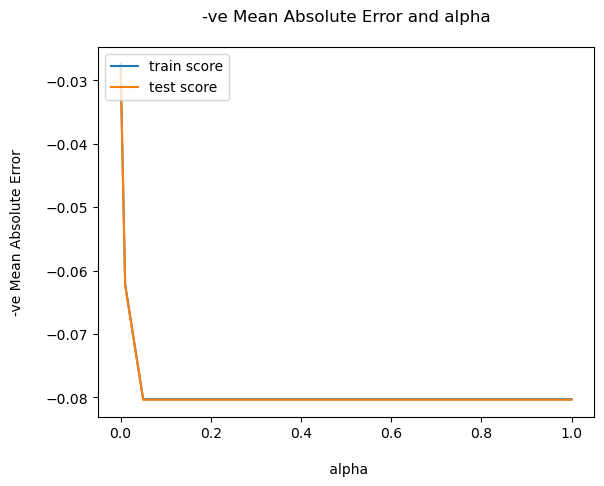

In [120]:
# plotting mean test and train scoes with alpha 
lasso_result['param_alpha'] = lasso_result['param_alpha'].astype('float32')

# plotting
plt.plot(lasso_result['param_alpha'], lasso_result['mean_train_score'])
plt.plot(lasso_result['param_alpha'], lasso_result['mean_test_score'])
plt.xlabel('\n alpha')
plt.ylabel('-ve Mean Absolute Error\n')
plt.title("-ve Mean Absolute Error and alpha\n")
plt.legend(['train score', 'test score'], loc='upper left')
plt.show()

In [153]:
alpha2 = lasso_model.best_params_['alpha']*2
lasso2 = Lasso(alpha=alpha2)

lasso2.fit(X_train, y_train)

#coefficient
lasso2.coef_

array([-0.03609214, -0.        , -0.        ,  0.        ,  0.        ,
       -0.00555811,  0.01450454, -0.        , -0.        ,  0.02943439,
        0.01284928, -0.        , -0.        , -0.00568371, -0.01087446,
        0.1650043 ,  0.03175747,  0.00896273,  0.01345118,  0.04439807,
       -0.00598271, -0.        ,  0.00812194,  0.0630396 , -0.02675791,
        0.        ,  0.        , -0.02797937,  0.00686906, -0.01735505,
       -0.01281345,  0.00890552,  0.00086588,  0.        , -0.        ,
        0.        , -0.        , -0.00307234,  0.00358614, -0.        ,
        0.        ,  0.00374656, -0.        ,  0.30998575,  0.03752419,
        0.        ,  0.00773319,  0.        , -0.        , -0.        ,
       -0.04242322,  0.01519281,  0.02309889,  0.02879169, -0.01116832,
       -0.        , -0.00274501, -0.0122849 ,  0.06817432,  0.        ,
        0.        ,  0.        ,  0.00436013,  0.01783304, -0.        ,
       -0.        ,  0.        ,  0.00543973, -0.        , -0.  

In [121]:
alpha = lasso_model.best_params_['alpha']
lasso = Lasso(alpha=alpha)

lasso.fit(X_train, y_train)

#coefficient
lasso.coef_

array([-3.57683570e-02, -5.02352490e-05, -3.68348820e-02,  3.83545448e-02,
        1.37228474e-02, -4.92056131e-03,  1.70096796e-02, -0.00000000e+00,
       -2.62238485e-04,  3.10215938e-02,  1.45976465e-02, -0.00000000e+00,
       -8.44903155e-03, -7.67554123e-03, -1.34836596e-02,  1.57049405e-01,
        4.23482871e-02,  6.67427803e-03,  1.55757294e-02,  5.38251764e-02,
       -7.49334383e-03,  0.00000000e+00,  1.11817532e-02,  6.49047505e-02,
       -2.80716242e-02,  0.00000000e+00,  1.36573463e-03, -2.61227562e-02,
        8.25020455e-03, -1.73702099e-02, -1.01811780e-02,  2.67141871e-02,
        2.36569869e-03,  0.00000000e+00, -1.15091497e-03,  0.00000000e+00,
       -0.00000000e+00, -3.34630922e-03,  1.89176671e-03, -4.35191225e-04,
        0.00000000e+00,  3.42986847e-03, -1.67447570e-03,  3.24707004e-01,
        3.74699183e-02,  0.00000000e+00,  8.94669663e-03, -0.00000000e+00,
       -6.06226186e-04, -1.35249910e-02, -4.10708979e-02,  2.24183652e-02,
        2.79030181e-02,  

In [122]:
# lasso model parameters
model_param = list(lasso.coef_ )
model_param.insert(0, lasso.intercept_)
model_param = [round(x, 4) for x in model_param]
cols = X_train.columns
cols = cols.insert(0, "constant")
list(zip(cols, model_param))

[('constant', -0.0041),
 ('MSSubClass', -0.0358),
 ('MSZoning', -0.0001),
 ('LotFrontage', -0.0368),
 ('LotArea', 0.0384),
 ('Street', 0.0137),
 ('LotShape', -0.0049),
 ('LandContour', 0.017),
 ('Utilities', -0.0),
 ('LotConfig', -0.0003),
 ('LandSlope', 0.031),
 ('Neighborhood', 0.0146),
 ('Condition1', -0.0),
 ('Condition2', -0.0084),
 ('BldgType', -0.0077),
 ('HouseStyle', -0.0135),
 ('OverallQual', 0.157),
 ('OverallCond', 0.0423),
 ('YearRemodAdd', 0.0067),
 ('RoofStyle', 0.0156),
 ('RoofMatl', 0.0538),
 ('Exterior1st', -0.0075),
 ('Exterior2nd', 0.0),
 ('MasVnrType', 0.0112),
 ('MasVnrArea', 0.0649),
 ('ExterQual', -0.0281),
 ('ExterCond', 0.0),
 ('Foundation', 0.0014),
 ('BsmtQual', -0.0261),
 ('BsmtCond', 0.0083),
 ('BsmtExposure', -0.0174),
 ('BsmtFinType1', -0.0102),
 ('BsmtFinSF1', 0.0267),
 ('BsmtFinType2', 0.0024),
 ('BsmtFinSF2', 0.0),
 ('BsmtUnfSF', -0.0012),
 ('TotalBsmtSF', 0.0),
 ('Heating', -0.0),
 ('HeatingQC', -0.0033),
 ('CentralAir', 0.0019),
 ('Electrical', -0.0

In [125]:
# lasso prediction and model making 
lasso_m = Lasso(alpha=lasso_model.best_params_['alpha'])
lasso_m.fit(X_train_rfe, y_train)
X_val = x_df_val[col_rfe]

# prediction on the train,test and val set
y_train_pred = lasso_m.predict(X_train_rfe)
print(f'r2 on train =  {round(metrics.r2_score(y_true=y_train, y_pred=y_train_pred),4)}')
y_val_pred = lasso_m.predict(X_val)
print(f'r2 on test =  {round(metrics.r2_score(y_true=y_df_val, y_pred=y_val_pred),4)}')


r2 on train =  0.8287
r2 on test =  0.8575


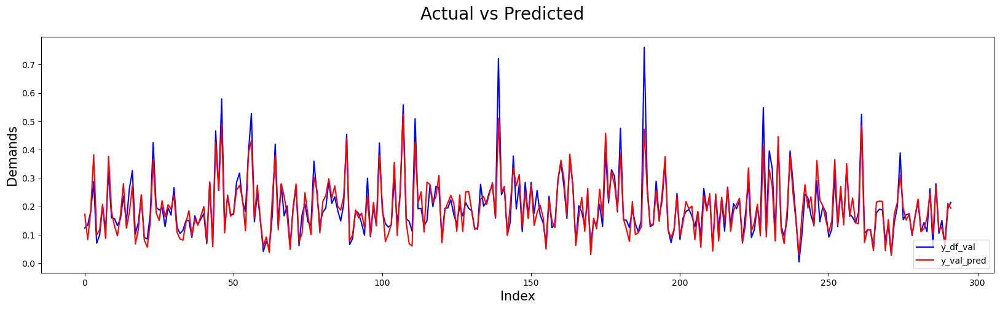

In [126]:
# Actual vs Predicted
plt.figure(figsize=[20,5])
c = [i for i in range(0,len(y_df_val),1)]
plt.plot(c,y_df_val, color="blue")
plt.plot(c,y_val_pred, color="red")
plt.suptitle('Actual vs Predicted\n', fontsize = 20)
plt.legend(["y_df_val", "y_val_pred"], loc ="lower right")
plt.xlabel('Index',fontsize=15)
plt.ylabel('Demands',fontsize=15)
plt.show()

In [127]:
print('RMSE error ', np.sqrt(metrics.mean_squared_error(y_df_val, y_val_pred)))

RMSE error  0.0408154502578859


## Residual Analysis of the test data

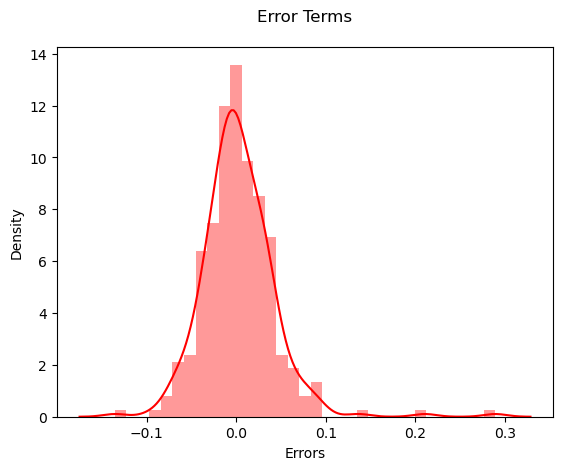

In [128]:
#Plot a histogram of the error terms
def plot_res_dist(act, pred):
    sns.distplot(act-pred,color='red')
    plt.title('Error Terms\n')
    plt.xlabel('Errors')
    
plot_res_dist(y_df_val,y_val_pred)

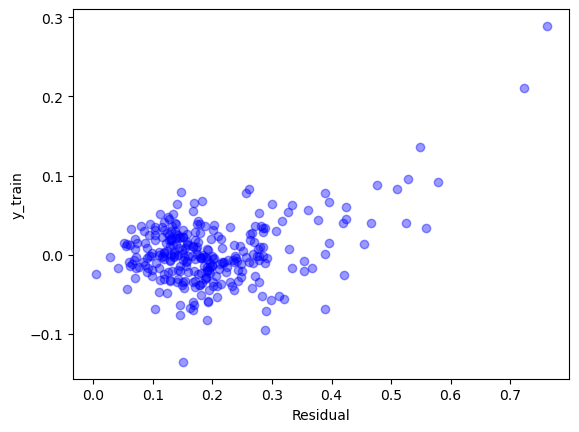

In [129]:
# scatter plot for the check
residual = (y_df_val-y_val_pred)
plt.scatter(y_df_val,residual,color="blue",alpha=.4)
plt.ylabel("y_train")
plt.xlabel("Residual")
plt.show()

#### Ridge Regression :

In [131]:
# Applying lasso with hyperparametertuning

alphas = {'alpha': [0.00001,0.0001, 0.001, 0.01, 0.05, 0.1, 
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 30,40,50, 60,70,
 80,90,100, 200,300,400,500,600,700,800,900,1000 ]}

ridge_reg = Ridge()

# 50 cross validations
folds = 50
ridge_model_cv = GridSearchCV(estimator = ridge_reg, n_jobs=-1,scoring= 'neg_mean_absolute_error', 
                        param_grid = alphas, 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            

ridge_model_cv.fit(X_train, y_train) 

Fitting 50 folds for each of 42 candidates, totalling 2100 fits


GridSearchCV(cv=50, estimator=Ridge(), n_jobs=-1,
             param_grid={'alpha': [1e-05, 0.0001, 0.001, 0.01, 0.05, 0.1, 0.2,
                                   0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0,
                                   3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20,
                                   30, 40, 50, 60, 70, ...]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [132]:
ridge_model_cv.best_params_

{'alpha': 2.0}

In [133]:
ridge_output = pd.DataFrame(ridge_model_cv.cv_results_)
ridge_output = ridge_output[ridge_output['param_alpha']<=5]
ridge_output.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,split10_test_score,split11_test_score,split12_test_score,split13_test_score,split14_test_score,split15_test_score,split16_test_score,split17_test_score,split18_test_score,split19_test_score,split20_test_score,split21_test_score,split22_test_score,split23_test_score,split24_test_score,split25_test_score,split26_test_score,split27_test_score,split28_test_score,split29_test_score,split30_test_score,split31_test_score,split32_test_score,split33_test_score,split34_test_score,split35_test_score,split36_test_score,split37_test_score,split38_test_score,split39_test_score,split40_test_score,split41_test_score,split42_test_score,split43_test_score,split44_test_score,split45_test_score,split46_test_score,split47_test_score,split48_test_score,split49_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,split5_train_score,split6_train_score,split7_train_score,split8_train_score,split9_train_score,split10_train_score,split11_train_score,split12_train_score,split13_train_score,split14_train_score,split15_train_score,split16_train_score,split17_train_score,split18_train_score,split19_train_score,split20_train_score,split21_train_score,split22_train_score,split23_train_score,split24_train_score,split25_train_score,split26_train_score,split27_train_score,split28_train_score,split29_train_score,split30_train_score,split31_train_score,split32_train_score,split33_train_score,split34_train_score,split35_train_score,split36_train_score,split37_train_score,split38_train_score,split39_train_score,split40_train_score,split41_train_score,split42_train_score,split43_train_score,split44_train_score,split45_train_score,split46_train_score,split47_train_score,split48_train_score,split49_train_score,mean_train_score,std_train_score
0,0.007367,0.002803,0.004601,0.003189,0.00001,{'alpha': 1e-05},-0.019713,-0.029945,-0.020259,-0.019338,-0.022800,-0.016537,-0.071383,-0.034707,-0.031083,-0.025262,-0.030666,-0.021118,-0.023543,-0.019783,-0.018853,-0.039798,-0.022779,-0.040318,-0.022184,-0.050896,-0.028092,-0.018730,-0.036274,-0.023241,-0.021374,-0.024376,-0.019208,-0.025208,-0.027154,-0.031831,-0.027565,-0.031335,-0.020817,-0.023029,-0.035716,-0.037511,-0.052834,-0.030223,-0.041518,-0.029605,-0.032335,-0.042104,-0.027260,-0.028926,-0.035081,-0.021875,-0.023279,-0.030754,-0.027145,-0.022946,-0.029166,0.010085,21,-0.026831,-0.026748,-0.026828,-0.026941,-0.026837,-0.026898,-0.024357,-0.026610,-0.026540,-0.026715,-0.026660,-0.026828,-0.026715,-0.026836,-0.026853,-0.026249,-0.026868,-0.026358,-0.026772,-0.025806,-0.026666,-0.026873,-0.026564,-0.026779,-0.026856,-0.026698,-0.026814,-0.026754,-0.026722,-0.026570,-0.026783,-0.026609,-0.026814,-0.026750,-0.026586,-0.026563,-0.026266,-0.026608,-0.026372,-0.026708,-0.026507,-0.026450,-0.026755,-0.026674,-0.026637,-0.026748,-0.026720,-0.026587,-0.026597,-0.026761,-0.026621,0.000379
1,0.006311,0.001276,0.003514,0.000778,0.0001,{'alpha': 0.0001},-0.019713,-0.029945,-0.020259,-0.019338,-0.022800,-0.016537,-0.071382,-0.034707,-0.031083,-0.025262,-0.030666,-0.021118,-0.023543,-0.019783,-0.018853,-0.039798,-0.022779,-0.040319,-0.022184,-0.050896,-0.028092,-0.018730,-0.036274,-0.023241,-0.021374,-0.024376,-0.019208,-0.025207,-0.027154,-0.031831,-0.027565,-0.031335,-0.020817,-0.023029,-0.035715,-0.037511,-0.052834,-0.030223,-0.041518,-0.029605,-0.032334,-0.042104,-0.027260,-0.028926,-0.035081,-0.021875,-0.023278,-0.030754,-0.027145,-0.022946,-0.029166,0.010085,20,-0.026831,-0.026748,-0.026828,-0.026941,-0.026837,-0.026898,-0.024357,-0.026610,-0.026540,-0.026715,-0.026660,-0.026828,-0.026715,-0.026836,-0.026853,-0.026249,-0.026868,-0.026358,-0.026772,-0.025806,-0.026666,-0.026873,-0.

In [150]:
ridge_output[(ridge_output['param_alpha']==4) | (ridge_output['param_alpha']==2)]

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,split10_test_score,split11_test_score,split12_test_score,split13_test_score,split14_test_score,split15_test_score,split16_test_score,split17_test_score,split18_test_score,split19_test_score,split20_test_score,split21_test_score,split22_test_score,split23_test_score,split24_test_score,split25_test_score,split26_test_score,split27_test_score,split28_test_score,split29_test_score,split30_test_score,split31_test_score,split32_test_score,split33_test_score,split34_test_score,split35_test_score,split36_test_score,split37_test_score,split38_test_score,split39_test_score,split40_test_score,split41_test_score,split42_test_score,split43_test_score,split44_test_score,split45_test_score,split46_test_score,split47_test_score,split48_test_score,split49_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,split5_train_score,split6_train_score,split7_train_score,split8_train_score,split9_train_score,split10_train_score,split11_train_score,split12_train_score,split13_train_score,split14_train_score,split15_train_score,split16_train_score,split17_train_score,split18_train_score,split19_train_score,split20_train_score,split21_train_score,split22_train_score,split23_train_score,split24_train_score,split25_train_score,split26_train_score,split27_train_score,split28_train_score,split29_train_score,split30_train_score,split31_train_score,split32_train_score,split33_train_score,split34_train_score,split35_train_score,split36_train_score,split37_train_score,split38_train_score,split39_train_score,split40_train_score,split41_train_score,split42_train_score,split43_train_score,split44_train_score,split45_train_score,split46_train_score,split47_train_score,split48_train_score,split49_train_score,mean_train_score,std_train_score
15,0.010212,0.006245,0.004546,0.002213,2,{'alpha': 2.0},-0.020138,-0.029402,-0.02037,-0.015322,-0.023273,-0.015914,-0.061532,-0.034858,-0.033221,-0.023720,-0.030367,-0.019396,-0.023334,-0.020347,-0.019635,-0.038749,-0.024376,-0.042142,-0.021900,-0.047526,-0.028097,-0.020017,-0.036040,-0.022791,-0.021886,-0.022437,-0.019984,-0.024255,-0.026335,-0.031393,-0.027444,-0.030527,-0.018888,-0.024578,-0.035339,-0.038340,-0.052556,-0.029495,-0.041772,-0.028187,-0.031226,-0.041472,-0.027439,-0.030567,-0.033716,-0.021810,-0.024654,-0.031995,-0.027712,-0.023447,-0.028798,0.009279,1,-0.027081,-0.026949,-0.027056,-0.027154,-0.027033,-0.027159,-0.024852,-0.026843,-0.026751,-0.026980,-0.026908,-0.027086,-0.026942,-0.027078,-0.027101,-0.026530,-0.027058,-0.026631,-0.027024,-0.026133,-0.026879,-0.027101,-0.026767,-0.027045,-0.027088,-0.026977,-0.027059,-0.026978,-0.026937,-0.026852,-0.026994,-0.026856,-0.027069,-0.026978,-0.026854,-0.026821,-0.026504,-0.026868,-0.026640,-0.026929,-0.026764,-0.026623,-0.026997,-0.026911,-0.026879,-0.027003,-0.026959,-0.026830,-0.026835,-0.026994,-0.026867,0.000344
17,0.007636,0.004625,0.003850,0.001452,4,{'alpha': 4.0},-0.020434,-0.028786,-0.02027,-0.014660,-0.023440,-0.015397,-0.058671,-0.034624,-0.034793,-0.023786,-0.030149,-0.018619,-0.024823,-0.021135,-0.019871,-0.038872,-0.025148,-0.042337,-0.022099,-0.046508,-0.028275,-0.021260,-0.035788,-0.022919,-0.022357,-0.022274,-0.020341,-0.025268,-0.025766,-0.032291,-0.027334,-0.030359,-0.018656,-0.025280,-0.035148,-0.038158,-0.052723,-0.029502,-0.041800,-0.027493,-0.031103,-0.041250,-0.028160,-0.031607,-0.033157,-0.021943,-0.025575,-0.032639,-0.027956,-0.024142,-0.028899,0.009008,7,-0.027394,-0.027254,-0.027392,-0.027478,-0.027341,-0.027490,-0.025448,-0.027163,-0.027052,-0.027296,-0.027229,-0.027410,-0.027261,-0.027396,-0.027422,-0.026878,-0.027374,-0.026982,-0.027344,-0.026569,-0.027221,-0.027388,-0.027083,-0.027378,-

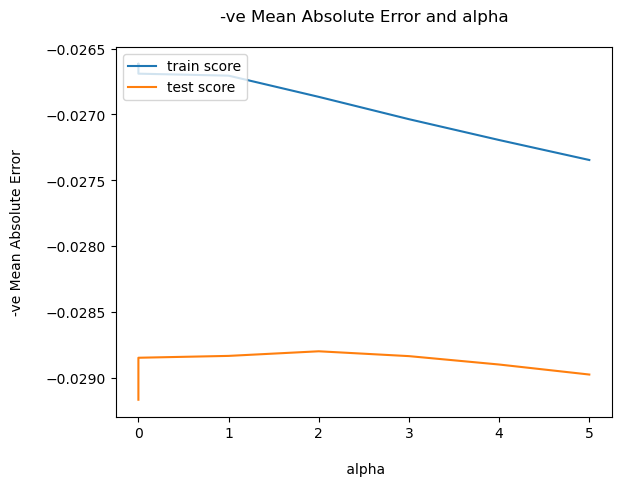

In [134]:
# plotting mean test and train scoes with alpha 
ridge_output['param_alpha'] = ridge_output['param_alpha'].astype('int32')

# plotting
plt.plot(ridge_output['param_alpha'], ridge_output['mean_train_score'])
plt.plot(ridge_output['param_alpha'], ridge_output['mean_test_score'])
plt.xlabel('\n alpha')
plt.ylabel('-ve Mean Absolute Error\n')
plt.title("-ve Mean Absolute Error and alpha\n")
plt.legend(['train score', 'test score'], loc='upper left')
plt.show()

In [151]:
alpha2 = ridge_model_cv.best_params_['alpha'] *2
ridge_model2 = Ridge(alpha=alpha2)

ridge_model2.fit(X_train, y_train)

#coefficient
ridge_model2.coef_

array([-0.02666317, -0.00014661, -0.02682238,  0.03509471,  0.02477407,
       -0.00532553,  0.01522926, -0.01287945, -0.00124372,  0.03046417,
        0.01754548,  0.00118731, -0.02391932, -0.01134983, -0.01900449,
        0.1203744 ,  0.04041552,  0.00910296,  0.02235739,  0.05545731,
       -0.01445783,  0.00582126,  0.010106  ,  0.06299293, -0.03194769,
       -0.00018093,  0.01022417, -0.0271018 ,  0.00853162, -0.01931156,
       -0.00952271,  0.03675974,  0.00826119,  0.01078928,  0.00121497,
        0.03702349, -0.01075807, -0.00463963,  0.00465026, -0.00347396,
        0.0781801 ,  0.06674307,  0.00365087,  0.09054665,  0.03697605,
        0.00577009,  0.02894445,  0.00455221, -0.00867492, -0.02324715,
       -0.04275536,  0.05628429,  0.02604605,  0.03593614, -0.01264943,
       -0.00197549, -0.01538999, -0.01144135,  0.06020461,  0.0304577 ,
       -0.00298335,  0.00314617,  0.00794347,  0.02291436, -0.00936495,
        0.00395139,  0.01105386,  0.01642077,  0.00424331, -0.00

In [135]:
alpha = ridge_model_cv.best_params_['alpha']
ridge_model = Ridge(alpha=alpha)

ridge_model.fit(X_train, y_train)

#coefficient
ridge_model.coef_

array([-0.02972023, -0.00168055, -0.0437245 ,  0.04856134,  0.03071899,
       -0.00494859,  0.01702551, -0.02251255, -0.00116884,  0.0321859 ,
        0.01745803,  0.0009677 , -0.03897048, -0.01047974, -0.01863951,
        0.13266524,  0.04577025,  0.00679937,  0.02088616,  0.06054986,
       -0.01628485,  0.00772209,  0.01149308,  0.0660328 , -0.02998667,
       -0.00015274,  0.01071544, -0.02487398,  0.00859486, -0.01854167,
       -0.00833871,  0.03758873,  0.00931652,  0.0126141 , -0.00281308,
        0.03668947, -0.01748665, -0.00401301,  0.00203514, -0.00390706,
        0.0972597 ,  0.0717549 ,  0.0030631 ,  0.10809791,  0.03706833,
        0.00635192,  0.02349373,  0.00132774, -0.01806075, -0.02775108,
       -0.04139062,  0.05795732,  0.02837941,  0.03192528, -0.01214094,
       -0.00089642, -0.01988581, -0.01024649,  0.06711928,  0.02343589,
       -0.00352952,  0.00427262,  0.00725202,  0.02201732, -0.01405559,
        0.00454772,  0.01444569,  0.0170247 ,  0.00342346, -0.00

In [136]:
# ridge model parameters
model_param  = list(ridge_model.coef_)
model_param .insert(0, ridge_model.intercept_)
model_param  = [round(x, 3) for x in model_param ]
cols = X_train.columns
cols = cols.insert(0, "constant")
list(zip(cols, model_param ))

[('constant', -0.01),
 ('MSSubClass', -0.03),
 ('MSZoning', -0.002),
 ('LotFrontage', -0.044),
 ('LotArea', 0.049),
 ('Street', 0.031),
 ('LotShape', -0.005),
 ('LandContour', 0.017),
 ('Utilities', -0.023),
 ('LotConfig', -0.001),
 ('LandSlope', 0.032),
 ('Neighborhood', 0.017),
 ('Condition1', 0.001),
 ('Condition2', -0.039),
 ('BldgType', -0.01),
 ('HouseStyle', -0.019),
 ('OverallQual', 0.133),
 ('OverallCond', 0.046),
 ('YearRemodAdd', 0.007),
 ('RoofStyle', 0.021),
 ('RoofMatl', 0.061),
 ('Exterior1st', -0.016),
 ('Exterior2nd', 0.008),
 ('MasVnrType', 0.011),
 ('MasVnrArea', 0.066),
 ('ExterQual', -0.03),
 ('ExterCond', -0.0),
 ('Foundation', 0.011),
 ('BsmtQual', -0.025),
 ('BsmtCond', 0.009),
 ('BsmtExposure', -0.019),
 ('BsmtFinType1', -0.008),
 ('BsmtFinSF1', 0.038),
 ('BsmtFinType2', 0.009),
 ('BsmtFinSF2', 0.013),
 ('BsmtUnfSF', -0.003),
 ('TotalBsmtSF', 0.037),
 ('Heating', -0.017),
 ('HeatingQC', -0.004),
 ('CentralAir', 0.002),
 ('Electrical', -0.004),
 ('1stFlrSF', 0.0

In [138]:
# prediction with ridge 
ridge_model = Ridge(alpha=ridge_model_cv.best_params_['alpha'])
ridge_model.fit(X_train, y_train)

# predicttion on train,test and val
y_train_pred = ridge_model.predict(X_train)
print(f'r2 on train =  {round(metrics.r2_score(y_true=y_train, y_pred=y_train_pred),4)}')
y_test_pred = ridge_model.predict(x_df_val)
print(f'r2 on test =  {round(metrics.r2_score(y_true=y_df_val, y_pred=y_test_pred),4)}')

r2 on train =  0.8413
r2 on test =  0.8559


In [139]:
mod = list(zip(cols, model_param))
params = pd.DataFrame(mod)
params.columns = ['Variable', 'Coeff']
params_sort = params.sort_values((['Coeff']), axis = 0, ascending = False)
params_sort

,Variable,Coeff
16,OverallQual,0.133
44,GrLivArea,0.108
41,1stFlrSF,0.097
42,2ndFlrSF,0.072
59,GarageCars,0.067
24,MasVnrArea,0.066
20,RoofMatl,0.061
52,TotRmsAbvGrd,0.058
4,LotArea,0.049
17,OverallCond,0.046


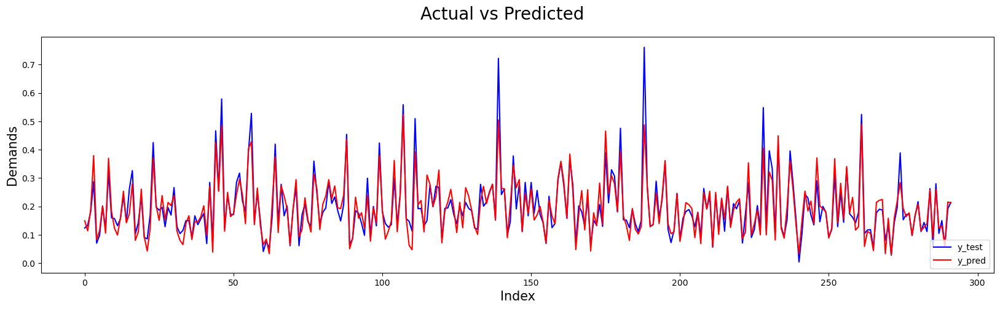

In [144]:
# Actual vs Predicted
plt.figure(figsize=[20,5])
c = [i for i in range(0,len(y_df_val),1)]
plt.plot(c,y_df_val, color="blue")
plt.plot(c,y_test_pred, color="red")
plt.suptitle('Actual vs Predicted\n', fontsize = 20)
plt.legend(["y_test", "y_pred"], loc ="lower right")
plt.xlabel('Index',fontsize=15)
plt.ylabel('Demands',fontsize=15)
plt.show()

In [145]:
print('RMSE error ', np.sqrt(metrics.mean_squared_error(y_df_val, y_test_pred)))

RMSE error  0.04104386472146269


## Residual Analysis of the test data

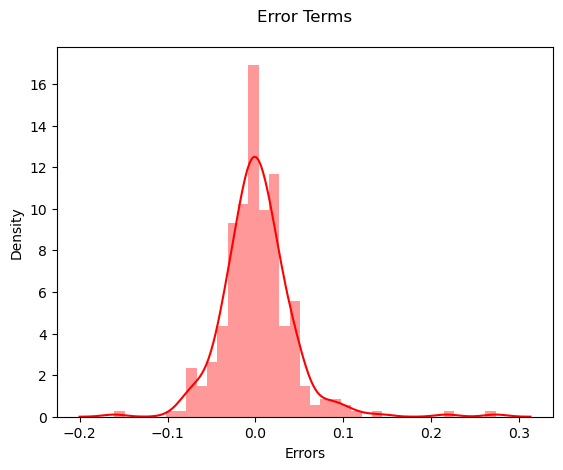

In [146]:
#Plot a histogram of the error terms
def plot_res_dist(act, pred):
    sns.distplot(act-pred,color='red')
    plt.title('Error Terms\n')
    plt.xlabel('Errors')
    
plot_res_dist(y_df_val,y_test_pred)

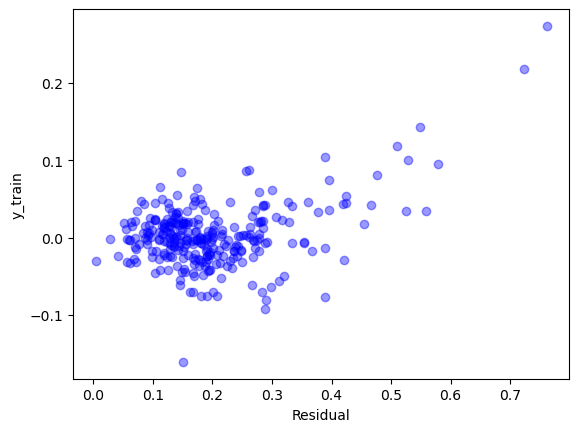

In [155]:
# scatter plot for the check
residual = (y_df_val-y_test_pred)
plt.scatter(y_df_val,residual,color="blue",alpha=.4)
plt.ylabel("y_train")
plt.xlabel("Residual")
plt.show()